# Import data (features)

In [1]:
import pandas as pd
import numpy as np

# Specify the path to the pickle file
data_file_path = '../Dataset/Dementia_paper_dataset_data.pkl'
info_file_path = '../Dataset/Dementia_paper_dataset_info.pkl'

# Open the pickle file in read mode
with open(data_file_path, 'rb') as file:
    # Load the data from the pickle file
    data = pd.read_pickle(file)

# Open the pickle file in read mode
with open(info_file_path, 'rb') as file:
    # Load the data from the pickle file
    info = pd.read_pickle(file)

# Display the first few rows of the data
data['train'].head()

,ID,Task,Coh_delta_T5-T3,Coh_delta_T5-F7,Coh_delta_T5-O1,Coh_delta_T5-Cp3,Coh_delta_T5-Fc3,Coh_delta_T5-Fp1,Coh_delta_T5-Fcz,Coh_delta_T5-Cpz,...,Corr_Cp4-O2,Corr_Cp4-F8,Corr_Cp4-T4,Corr_Cp4-T6,Corr_O2-F8,Corr_O2-T4,Corr_O2-T6,Corr_F8-T4,Corr_F8-T6,Corr_T4-T6
0,NTUH_0004,Rest,0.739369,0.701256,0.759699,0.741979,0.482286,0.165846,0.110406,0.291415,...,0.765194,0.567678,0.708985,0.803361,0.404576,0.661505,0.919683,0.717551,0.520095,0.783182
1,CGMHKL_0002,Rest,0.814006,0.304687,0.923202,0.659374,0.235388,0.263912,0.233530,0.494247,...,0.594284,0.311152,0.518404,0.688676,0.192620,0.477090,0.762633,0.449235,0.383965,0.661592
2,NTUH_0011,Rest,0.756742,0.273296,0.838798,0.849737,0.255621,0.145847,0.172226,0.420560,...,0.648830,0.432738,0.592082,0.750562,0.244982,0.558273,0.891249,0.643338,0.400314,0.701446
3,CGMHKL_0005,Rest,0.755170,0.332022,0.721507,0.514757,0.138277,0.259687,0.193953,0.307590,...,0.614496,0.296134,0.239646,0.736570,0.284022,0.345613,0.818268,0.302792,0.371725,0.428486
4,CGMHKL_0004,Rest,0.651956,0.284282,0.611058,0.573420,0.240884,0.169931,0.155174,0.229636,...,0.347948,0.311138,0.429988,0.502850,0.242461,0.377395,0.727081,0.626247,0.420851,0.575280


Find the indices of HC or MCI subjects, exclude dementia

In [2]:
# Find the indices of HC or MCI subjects
for key, value in info.items():
    if key == 'Info': pass
    else:
        info[key] = value[value['Group'] != 'Dementia']
        print(key)
        print(info[key].shape)

for key, value in data.items():
    if key == 'Info': pass
    else:
        data[key] = value.loc[value['ID'].isin(info[key]['ID'])]
        print(key)
        print(data[key].shape)

train
(126, 15)
valid
(49, 15)
test
(81, 15)
train
(126, 13052)
valid
(49, 13052)
test
(81, 13052)


In [3]:
info['train'].head()

,ID,Group,Date,Label,Age,Gender,MT_R1,MT_R2,GDS_total,MMSE_total,IADL_total,ADL_total,CDR_total,MoCA_total,Identifier
3,NTUH_0004,SCD-MCI,2021-03-17 11:04:20,1,60,Male,9.0,10.0,9,26,23,0,0.5,20,I-LlVC35-BudslXK86oLKnG-JaVsNkTVQ2kcy-e0pyVGlk...
5,CGMHKL_0002,Control,2021-03-25 14:42:52,0,70,Male,8.0,8.0,4,27,0,0,0.0,29,I-LlVC21-BpHLTdYl5DR_Dc6FWLOifn-chc7aaEZ1iamk8...
12,NTUH_0011,Control,2021-03-25 14:42:48,0,57,Male,9.0,8.0,2,27,23,0,0.0,30,I-LlVC39-BuQ5ltQ56CTQnupca4m2kTlBPtULeLHqbyW8X...
20,CGMHKL_0005,SCD-Control,2021-04-07 09:42:01,0,70,Male,7.0,5.0,15,30,1,0,0.0,26,I-LlVC16-BPy8atYUSly69LpLBe6iwtaBM6AnVMwXCEz5a...
25,CGMHKL_0004,Control,2021-03-29 14:58:02,0,54,Female,9.0,7.0,1,30,0,0,0.0,28,I-LlVC22-BuPE0tIldhQVc46dHiKfnwrHCIaX3wg6k3nkb...


Calculate the numbers of each label

### Data preprocessing and apply fisher's criterion (Abandoned)

In [4]:
'''# Export the data to an Excel file
# Import the pandas library
import pandas as pd

# Specify the file path for the Excel file
excel_file_path = '../Dataset/Dementia_paper_dataset_data.xlsx'

# Create an ExcelWriter object
writer = pd.ExcelWriter(excel_file_path, engine='openpyxl')

# Loop through the dictionary items and save each dataframe as a separate sheet in the Excel file
for key, value in info.items():
    if key != 'Info':
        # Write the dataframe to the Excel file
        value.to_excel(writer, sheet_name=key, index=False)

# Save the Excel file''
writer.close()'''



"# Export the data to an Excel file\n# Import the pandas library\nimport pandas as pd\n\n# Specify the file path for the Excel file\nexcel_file_path = '../Dataset/Dementia_paper_dataset_data.xlsx'\n\n# Create an ExcelWriter object\nwriter = pd.ExcelWriter(excel_file_path, engine='openpyxl')\n\n# Loop through the dictionary items and save each dataframe as a separate sheet in the Excel file\nfor key, value in info.items():\n    if key != 'Info':\n        # Write the dataframe to the Excel file\n        value.to_excel(writer, sheet_name=key, index=False)\n\n# Save the Excel file''\nwriter.close()"

HC: 0, MCI: 1, Dementia: 2

In [5]:
import numpy as np
# Dataframe to numpy array in each dictionary
data_ndarrays = {}
for key, value in data.items():
    # Detect if the key is 'Info' and skip it
    if key != 'Info':
        # Drop the 'ID' and 'Task' columns if they exist
        if 'ID' in data[key].columns:
            data[key].drop('ID', axis=1, inplace=True)
        if 'Task' in data[key].columns:
            data[key].drop('Task', axis=1, inplace=True)  
        data_ndarrays[key] = value.values
    else:
        data_ndarrays[key] = value

label_ndarrays = {}
label_ndarrays_CInonCI = {}
for key, value in info.items():
    if key != 'Info':
        label_ndarrays[key] = value['Label'].values
        label_ndarrays_CInonCI[key] = value['Label'].values
    else:
        label_ndarrays[key] = value
        label_ndarrays_CInonCI[key] = value

# Replace 2 with 1 in label_ndarrays
label_ndarrays_CInonCI = {key: np.where(value == 2, 1, value) for key, value in label_ndarrays_CInonCI.items()}

print(label_ndarrays['train'])
print(label_ndarrays['train'].shape)

[1 0 0 0 0 0 1 0 0 1 0 1 1 0 1 0 0 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 1 1 0 1
 1 1 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0 1 1 0 1 0 0 1 0 0 0 1 1 0 0 0 0 0 0 1 0
 1 1 1 0 1 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 0
 0 1 0 0 1 1 1 0 0 0 0 0 0 1 1]
(126,)


In [6]:
for key, value in info.items():
    if key == 'Info': pass
    else:
        print(key,':')
        print(value.Label.value_counts())
        print()

train :
Label
0    78
1    48
Name: count, dtype: int64

valid :
Label
0    29
1    20
Name: count, dtype: int64

test :
Label
0    47
1    34
Name: count, dtype: int64



# ML classification

## gridSearchCV within SFS

### class

In [7]:
class sequential_feture_selection_gridSearch():
    def __init__(self, gridSearchCV, k_features=None, forward=True):
        self.gridSearchCV = gridSearchCV
        self.k_features = k_features
        self.forward = forward

        # create a list to store the chosen features (to eliminate or add features to the model)
        self.chosen_feature_idx = list()
        self.remain_feature_idx = list()
        
        # create a dict to store the metrics of all iterations
        self.metrics = dict()
        self.metrics['avg_score'] = list()
        self.metrics['feature_idx'] = list()
        self.metrics['best_params'] = list()


    def iteratly_fit_remain_feature(self, X, y):
        # Forward selection
        scores = list()
        iteratly_best_params = list()
        if self.forward:
            print('len(self.remain_feature_idx):',len(self.remain_feature_idx))
            for idx, feature_idx in enumerate(self.remain_feature_idx):
                self.gridSearchCV.fit(X[:, self.chosen_feature_idx+[feature_idx]], y) # Fit the gridSearchCV with the chosen features
                scores.append(self.gridSearchCV.best_score_) # Append the CV score of the best_estimator to the list
                iteratly_best_params.append(self.gridSearchCV.best_params_)

            scores = np.array(scores) # Convert the list to a numpy array
            best_idx = np.argmax(scores) # Get the index of the best score
            self.chosen_feature_idx.append(self.remain_feature_idx[best_idx]) # Append the best feature to the chosen_feature_idx
            self.remain_feature_idx.pop(best_idx) # Remove the best feature from the remain_feature_idx

            # Store the metrics of this iteration
            self.metrics['avg_score'].append(scores[best_idx])
            self.metrics['feature_idx'].append(self.chosen_feature_idx.copy())
            self.metrics['best_params'].append(iteratly_best_params[best_idx])

        # Backward selection
        else:
            print('Backward selection')
            print('self.remain_feature_idx:',self.remain_feature_idx)
            for idx, feature_idx in enumerate(self.remain_feature_idx):
                if len(self.remain_feature_idx) == 1:
                    self.gridSearchCV.fit(X[:, self.remain_feature_idx], y)
                    scores.append(self.gridSearchCV.best_score_)
                    iteratly_best_params.append(self.gridSearchCV.best_params_)
                    break
                
                iteratly_remain_feature_idx = self.remain_feature_idx.copy()
                iteratly_remain_feature_idx.remove(feature_idx)
                self.gridSearchCV.fit(X[:, iteratly_remain_feature_idx], y)
                scores.append(self.gridSearchCV.best_score_)
                iteratly_best_params.append(self.gridSearchCV.best_params_)

            scores = np.array(scores) # Convert the list to a numpy array
            print(scores)
            best_idx = np.argmax(scores) # Get the index of the worst score
            self.chosen_feature_idx.append(self.remain_feature_idx[best_idx]) # Remove the worst feature from the chosen_feature_idx
            self.remain_feature_idx.pop(best_idx) # Remove the worst feature from the remain_feature_idx

            
            # Store the metrics of this iteration
            self.metrics['avg_score'].append(scores[best_idx])
            self.metrics['feature_idx'].append(self.remain_feature_idx.copy())
            self.metrics['best_params'].append(iteratly_best_params[best_idx])
        

    def fit(self, X, y):
        # Initialize the remain_feature_idx
        self.remain_feature_idx = list(range(X.shape[1]))
        self.k_features = len(self.remain_feature_idx) if self.k_features is None else self.k_features

        if self.forward == False:
            self.gridSearchCV.fit(X, y)
            # Store the metrics of this iteration
            self.metrics['avg_score'].append(self.gridSearchCV.best_score_)
            self.metrics['feature_idx'].append(self.remain_feature_idx.copy())
            self.metrics['best_params'].append(self.gridSearchCV.best_params_)

        # Iterate the feature selection
        for idx in range(self.k_features):
            print('idx:', idx)
            self.iteratly_fit_remain_feature(X, y)
            if self.forward == False and len(self.remain_feature_idx) == 1:
                break

        metrics = pd.DataFrame(self.metrics)
        best_idx = np.argmax(metrics['avg_score'])
        print('best_idx:', best_idx)
        self.best_metric = metrics.iloc[best_idx]

        print('best_metric:', self.best_metric)



### verify

In [ ]:
from sklearn.datasets import make_classification
# Create the dataset
X, y = make_classification(n_samples=100, n_features=10, n_informative=5, n_redundant=0, n_classes=2, random_state=42)

In [ ]:
from sklearn.svm import SVC
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
import pandas as pd


# Create the SVM classifier
svm = SVC()

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,2) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [0.1, 1, 1000]
param_grid = [{'C': C_range, 'gamma':[0], 'kernel': ['linear']},
                {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(svm, param_grid, cv=5, n_jobs=10, verbose=0)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=False)

# Fit the model
sfs_gs.fit(X, y)


In [ ]:
sfs_gs.metrics
metrics = pd.DataFrame(sfs_gs.metrics)
metrics

# a = sfs_gs.best_metric.best_params
# print('type(a):', type(a))
# print('C:', sfs_gs.best_metric.best_params['C'])
# print('gamma:', sfs_gs.best_metric.best_params['gamma'])
# print('kernel:', sfs_gs.best_metric.best_params['kernel'])

# sfs_gs.best_metric.avg_score

## Feature selection - Relief
Ref:
- [Feature Selection with RReliefF (Regression)](https://www.kaggle.com/code/jorgesandoval/feature-selection-with-rrelieff-regression/notebook)
- [sklearn-relief](https://gitlab.com/moongoal/sklearn-relief/-/blob/master/README.md?ref_type=heads)

In [ ]:
# data organizing and feature selection(fisher score)
import os
import sklearn_relief as relief

# Train & Valid data organizing
data_train_valid = np.concatenate([data_ndarrays['train'], data_ndarrays['valid']], axis=0)
label_train_valid = np.concatenate([label_ndarrays_CInonCI['train'], label_ndarrays_CInonCI['valid']], axis=0)

# Independent test data organizing
data_test = data_ndarrays['test']
label_test = label_ndarrays_CInonCI['test']

# Feature selection - filter_based
rf = relief.Relief(n_features=200, n_jobs=7)
rf.fit_transform(data_train_valid, label_train_valid)
relief_scores = rf.w_
relief_idx = np.argsort(relief_scores)[::-1] # sort in descending order

### LDA

#### Only Add-one-feature-in

In [ ]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Create the SVM classifier
lda = LinearDiscriminantAnalysis()

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# Specify the folder path
folder_path = '../Results/Classification/LDA/5Fold_test/Relief-AOFI'
# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
for idx_AOFI in tqdm(range(1, max_dim+1)):
    data_CV = data_train_valid[:, relief_idx[:idx_AOFI]]
    
    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=lda, param_grid=param_grid, cv=5, n_jobs=7)

    # Train the model with gridsearchCV
    grid_search.fit(data_CV, label_train_valid)

    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Get the best model
    best_model = grid_search.best_estimator_
    test_score = best_model.score(data_test[:, relief_idx[:idx_AOFI]], label_test)
    
    # Append the loop index and accCV to the dataframe
    df_accCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score})

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx_AOFI)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(relief_idx[:idx_AOFI]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'relief_idx' and 'feature_type' as keys
relief_idx_DF = {'relief_idx': relief_idx, 'feature_type': data['train'].columns[relief_idx]}
relief_idx_DF = pd.DataFrame(relief_idx_DF) # Convert the dictionary to a DataFrame
relief_idx_DF.to_csv(os.path.join(folder_path, 'relief_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

#### Sequential feature selection
Sequential feature selection (Forward or Backward) on features with top-200 fisher's scores
Reference: 
- [API](https://rasbt.github.io/mlxtend/user_guide/feature_selection/SequentialFeatureSelector/#example-7-using-the-selected-feature-subset-for-making-new-predictions)
- [This stackoverflow post](https://stackoverflow.com/questions/55609339/how-to-perform-feature-selection-with-gridsearchcv-in-sklearn-in-python) 

In [ ]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

# Create the LDA classifier
lda = LinearDiscriminantAnalysis()

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# Specify the folder path
bool_SFS = False
if bool_SFS: folder_path = '../Results/Classification/LDA/5Fold_test/Relief-SFS'
else: folder_path = '../Results/Classification/LDA/5Fold_test/Relief-SBS'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
# max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
max_dim = 200

# Create the SequentialFeatureSelector object
sfs = SFS(estimator=lda, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=7, verbose=2)

# Train the model with SequentialFeatureSelector
sfs.fit(data_train_valid[:, relief_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs.k_feature_idx_
best_feature_idx_ = relief_idx[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs.k_score_

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

# Get the best model
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in df_accCV.iterrows():
    feature_idx = relief_idx[[row.feature_idx]]
    best_model = lda.fit(data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(relief_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'relief_idx' and 'feature_type' as keys
relief_idx_DF = {'relief_idx': relief_idx, 'feature_type': data['train'].columns[relief_idx]}
relief_idx_DF = pd.DataFrame(relief_idx_DF) # Convert the dictionary to a DataFrame
relief_idx_DF.to_csv(os.path.join(folder_path, 'relief_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

### SVM

#### Only Add-one-feature-in

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import pandas as pd
from tqdm import tqdm, trange
from joblib import dump, load

# Create the SVM classifier
svm = SVC()

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,41) #-100,-95,...,95,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1, 10, 100, 500, 1000]
param_grid = {'C': C_range, 'gamma': gamma_range, 'kernel': ['linear','rbf']}

# Specify the folder path
folder_path = '../Results/Classification/SVM/5Fold_test/Relief-AOFI'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
for idx_AOFI in tqdm(range(1, max_dim + 1)):
    data_CV = data_train_valid[:, relief_idx[:idx_AOFI]]
    
    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, n_jobs=7)

    # Train the model with gridsearchCV
    grid_search.fit(data_CV, label_train_valid)

    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Get the best model
    best_model = grid_search.best_estimator_
    test_score = best_model.score(data_test[:, relief_idx[:idx_AOFI]], label_test)
    
    # Append the loop index and accCV to the dataframe
    df_accCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score})
    
    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/') # Specify the folder path to save models
    if not os.path.exists(model_folder):    os.makedirs(model_folder) # Create the folder if it does not exist
    model_file = os.path.join(model_folder, 'best_model_'+str(idx_AOFI)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(relief_idx[:idx_AOFI]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'relief_idx' and 'feature_type' as keys
fisher_idx_DF = {'relief_idx': relief_idx, 'feature_type': data['train'].columns[relief_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

#### Sequential feature selection

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
# C_range = [1, 100, 1000]
C_range = [1]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = {'C': C_range, 'gamma': gamma_range, 'kernel': ['linear', 'rbf']}
param_grid_list = list(ParameterGrid(param_grid))


# Specify the folder path
bool_forward = False
if bool_forward: folder_path = '../Results/Classification/SVM/5Fold_test/Relief-SFS'
else: folder_path = '../Results/Classification/SVM/5Fold_test/Relief-SBS'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)


gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = 500

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_forward, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, relief_idx[:max_dim]], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = relief_idx[[best_feature_idx_]]
    best_feature_set = data['train'].columns.values[[best_feature_idx_]]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = relief_idx[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(relief_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'relief_idx' and 'feature_type' as keys
relief_idx_DF = {'relief_idx': relief_idx, 'feature_type': data['train'].columns[relief_idx]}
relief_idx_DF = pd.DataFrame(relief_idx_DF) # Convert the dictionary to a DataFrame
relief_idx_DF.to_csv(os.path.join(folder_path, 'relief_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

## Feature selection (filter) - Remove Collinear Features

In [ ]:
# correlated_max_dim = 1000

# data_train_valid = data_train_valid[:, fisher_idx[:correlated_max_dim]]
# data_test = data_test[:, fisher_idx[:correlated_max_dim]]

# data_train_valid_new, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

# data_test = pd.DataFrame(data_test)
# data_test_new = data_test.drop(columns=drops)
# data_test_new = data_test_new.values
# fisher_idx = fisher_idx[:correlated_max_dim]
# fisher_idx = pd.Series(fisher_idx)
# fisher_idx.drop(drops, inplace=True)

# print(data_train_valid_new.shape)
# print(data_test_new.shape)
# print(fisher_idx.shape)

## Feature selection (filter) - Fisher's Criterion

In [8]:
# data organizing and feature selection(fisher score)
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module

# Train & Valid data organizing
data_train_valid = np.concatenate([data_ndarrays['train'], data_ndarrays['valid']], axis=0)
label_train_valid = np.concatenate([label_ndarrays_CInonCI['train'], label_ndarrays_CInonCI['valid']], axis=0)

# Independent test data organizing
data_test = data_ndarrays['test']
label_test = label_ndarrays_CInonCI['test']

# Feature selection - filter_based
f_selection = f_selection()
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

### LDA

#### Only Add-one-feature-in

In [ ]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Create the SVM classifier
lda = LinearDiscriminantAnalysis()

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# Specify the folder path
folder_path = '../Results/Classification/LDA/5Fold_test/AOFI'
# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
for idx_AOFI in tqdm(range(1, max_dim+1)):
    data_CV = data_train_valid[:, fisher_idx[:idx_AOFI]]
    
    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=lda, param_grid=param_grid, cv=5, n_jobs=7)

    # Train the model with gridsearchCV
    grid_search.fit(data_CV, label_train_valid)

    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Get the best model
    best_model = grid_search.best_estimator_
    test_score = best_model.score(data_test[:, fisher_idx[:idx_AOFI]], label_test)
    
    # Append the loop index and accCV to the dataframe
    df_accCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score})

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx_AOFI)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[:idx_AOFI]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

#### Sequential feature selection
Sequential feature selection (Forward or Backward) on features with top-200 fisher's scores
Reference: 
- [API](https://rasbt.github.io/mlxtend/user_guide/feature_selection/SequentialFeatureSelector/#example-7-using-the-selected-feature-subset-for-making-new-predictions)
- [This stackoverflow post](https://stackoverflow.com/questions/55609339/how-to-perform-feature-selection-with-gridsearchcv-in-sklearn-in-python) 

In [5]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Create the LDA classifier
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('scaler', StandardScaler()), ('lda', lda)])

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
max_dim = 200


# Specify the folder path
bool_SFS = True
if bool_SFS: folder_path = f'../Results/Classification/LDA/5Fold_test/SFS (z-score) max_dim = {max_dim}'
else: folder_path = f'../Results/Classification/LDA/5Fold_test/SBS (z-score) max_dim = {max_dim}'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()


# Create the SequentialFeatureSelector object
sfs = SFS(estimator=lda, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=7, verbose=2)

# Train the model with SequentialFeatureSelector
sfs.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs.k_feature_idx_
best_feature_idx_ = fisher_idx[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs.k_score_

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

# Get the best model
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in df_accCV.iterrows():
    feature_idx = fisher_idx[[row.feature_idx]]
    best_model = lda.fit(data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.9s
[Parallel(n_jobs=7)]: Done 187 out of 200 | elapsed:    1.0s remaining:    0.0s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    1.0s finished

[2024-06-24 22:52:07] Features: 1/200 -- score: 0.6583610188261352[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 199 out of 199 | elapsed:    0.1s finished

[2024-06-24 22:52:07] Features: 2/200 -- score: 0.682281284606866[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 198 out of 198 | elapsed:    0.1s finished

[2024-06-24 22:52:07] Features: 3/200 -- score: 0.701107419712071[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  

done
best_score: 0.8054263565891473
best_feature_idx: [12439  5496  4555  8845  4693  5419   701  8795   957 11960 11257  1107
  6946  8713  8720 11880  2525  5829  8589  4613  3798  3785   548  5395
 11007]
best_feature_set: Index(['RatioPower_beta_T4', 'RP-II_beta_Oz-P4', 'RP-II_theta_O1-P4',
       'PLI_theta_Tp7-Fz', 'RP-II_theta_Oz-Pz', 'RP-II_beta_Fc3-P3',
       'Coh_theta_Ft8-Fc4', 'PLI_theta_C4-T6', 'Coh_alpha_Fc3-Pz',
       'PLV_gamma_Fcz-F3', 'PLV_alpha_Ft8-Fc4', 'Coh_alpha_Ft8-Fc4',
       'RP-III_alpha_T3-C3', 'PLI_theta_Fcz-Fz', 'PLI_theta_Fcz-T4',
       'PLV_gamma_Cp3-Fc3', 'RP-I_theta_O1-P4', 'RP-II_gamma_Fc3-Pz',
       'PLI_theta_F7-C4', 'RP-II_theta_Fc3-Fc4', 'RP-I_gamma_Fc3-Fz',
       'RP-I_gamma_Fc3-Fcz', 'Coh_theta_Fc3-C3', 'RP-II_beta_Cp3-Ft7',
       'PLV_alpha_T3-F3'],
      dtype='object')
best_test_score: 0.5876288659793815


C:\Users\NESS\AppData\Local\Temp\ipykernel_10848\1448893606.py:70: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_10848\1448893606.py:60: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = fisher_idx[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_10848\1448893606.py:70: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

### SVM

#### Only Add-one-feature-in

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import pandas as pd
from tqdm import tqdm, trange
from joblib import dump, load

# Create the SVM classifier
svm = SVC()

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,41) #-100,-95,...,95,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1, 10, 100, 500, 1000]
param_grid = {'C': C_range, 'gamma': gamma_range, 'kernel': ['linear','rbf']}

# Specify the folder path
folder_path = '../Results/Classification/SVM/5Fold_test/AOFI'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
for idx_AOFI in tqdm(range(1, max_dim + 1)):
    data_CV = data_train_valid[:, fisher_idx[:idx_AOFI]]
    
    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, n_jobs=7)

    # Train the model with gridsearchCV
    grid_search.fit(data_CV, label_train_valid)

    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Get the best model
    best_model = grid_search.best_estimator_
    test_score = best_model.score(data_test[:, fisher_idx[:idx_AOFI]], label_test)
    
    # Append the loop index and accCV to the dataframe
    df_accCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score})
    
    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/') # Specify the folder path to save models
    if not os.path.exists(model_folder):    os.makedirs(model_folder) # Create the folder if it does not exist
    model_file = os.path.join(model_folder, 'best_model_'+str(idx_AOFI)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[:idx_AOFI]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

#### Sequential feature selection

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1, 100, 1000]


# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = {'C': C_range, 'gamma': gamma_range, 'kernel': ['linear', 'rbf']}
param_grid_list = list(ParameterGrid(param_grid))


# Specify the folder path
bool_forward = False
if bool_forward: folder_path = '../Results/Classification/SVM/5Fold_test/SFS'
else: folder_path = '../Results/Classification/SVM/5Fold_test/SBS'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)


gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = 200

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_forward, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = fisher_idx[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = fisher_idx[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

## KNN

#### Sequential feature selection
Sequential feature selection (Forward or Backward) on features with top-200 fisher's scores
Reference: 
- [API](https://rasbt.github.io/mlxtend/user_guide/feature_selection/SequentialFeatureSelector/#example-7-using-the-selected-feature-subset-for-making-new-predictions)
- [This stackoverflow post](https://stackoverflow.com/questions/55609339/how-to-perform-feature-selection-with-gridsearchcv-in-sklearn-in-python) 

In [9]:
# classifying the data using LDA and LOO-CV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.preprocessing import StandardScaler

# Create the KNN classifier and pipeline
knn = KNeighborsClassifier(n_neighbors=3)
pipe = Pipeline([('scaler', StandardScaler()), ('clf', knn)])

# max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
max_dim = 200

# Specify the folder path
bool_SFS = False
if bool_SFS: folder_path = f'../Results/Classification/KNN/5Fold_test/(z-score) SFS max_dim = {max_dim}'
else: folder_path = f'../Results/Classification/KNN/5Fold_test/(z-score) SBS max_dim = {max_dim}'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()


# Create the SequentialFeatureSelector object
sfs = SFS(estimator=pipe, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=7, verbose=2)

# Train the model with SequentialFeatureSelector
sfs.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs.k_feature_idx_
best_feature_idx_ = fisher_idx[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs.k_score_

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

# Get the best model
best_model = knn.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in df_accCV.iterrows():
    feature_idx = fisher_idx[[row.feature_idx]]
    best_model = knn.fit(data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    1.1s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    1.4s finished

[2024-06-24 20:39:45] Features: 199/1 -- score: 0.6959025470653378[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 199 out of 199 | elapsed:    0.3s finished

[2024-06-24 20:39:46] Features: 198/1 -- score: 0.7101882613510522[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 198 out of 198 | elapsed:    0.3s finished

[2024-06-24 20:39:46] Features: 197/1 -- score: 0.7244739756367664[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 197 out of 197 | e

done
best_score: 0.8575858250276855
best_feature_idx: [ 8868 12436 12439  5496  5388  8845 12381  5426  8711  8648  4100  3881
  8799  8776  8783  9800  8795  8680  8728 11960  3471  4101  8710  1107
  3684  6946  8717  8720  8095   707 12237 12427  4091  2886  8683  2525
  1063  8844  1215 10883 11107  6932  5395  8572  9441  1730  1049   813]
best_feature_set: Index(['PLI_theta_P3-Fz', 'RatioPower_beta_Cp4', 'RatioPower_beta_T4',
       'RP-II_beta_Oz-P4', 'RP-II_beta_Cp3-Oz', 'PLI_theta_Tp7-Fz',
       'RatioPower_theta_T4', 'RP-II_beta_Fc3-Cp4', 'PLI_theta_Fcz-C3',
       'PLI_theta_Cp3-Pz', 'RP-II_delta_T3-Tp8', 'RP-I_gamma_Oz-Pz',
       'PLI_theta_P4-Ft7', 'PLI_theta_F4-F8', 'PLI_theta_C4-Ft7',
       'PLI_gamma_F7-Cp3', 'PLI_theta_C4-T6', 'PLI_theta_Fp1-Cpz',
       'PLI_theta_Cpz-Tp7', 'PLV_gamma_Fcz-F3', 'RP-I_beta_Oz-P3',
       'RP-II_delta_T3-Tp7', 'PLI_theta_Fcz-P3', 'Coh_alpha_Ft8-Fc4',
       'RP-I_gamma_T3-Cp3', 'RP-III_alpha_T3-C3', 'PLI_theta_Fcz-Cp4',
       'PLI_th

C:\Users\NESS\AppData\Local\Temp\ipykernel_42748\480306583.py:54: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = fisher_idx[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_42748\480306583.py:64: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_42748\480306583.py:54: FutureWarning: Using a non-tuple sequence for multidimensional indexing is 

## Feature selection - RFE (recursive feature elimination) related
Fisher's Criterion choose top 500 feats. -> apply RFECV

### LDA

#### SFS (forward or backward, with gridSearchCV as "inner loop")

##### Sequential feature selection based on chosen features by "RFELR" (Add removing collinear features) 


In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

collinear_max_dim = 2000

# remove the collinear features
data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
data_test = data_test[:, fisher_idx[:collinear_max_dim]]

f_selection = f_selection()
data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

data_test = pd.DataFrame(data_test)
data_test = data_test.drop(columns=drops)
data_test = data_test.values
fisher_idx = fisher_idx[:collinear_max_dim]
fisher_idx = pd.Series(fisher_idx)
fisher_idx.drop(drops, inplace=True)

print(data_train_valid.shape)
print(data_test.shape)
print(fisher_idx.shape)

# Re-conduct Fisher's Criterion
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

# RFE
n_features_to_select = 200
selector = RFE(LogisticRegression(C=1000), n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
max_dim = 1000
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = {'solver': ['svd']}      

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/LDA/5Fold_test/(grCV within SFS) (remove collinear) RFELR-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(LinearDiscriminantAnalysis(), param_grid, cv=5, n_jobs=6, verbose=1, scoring='balanced_accuracy')

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
lda = LinearDiscriminantAnalysis(solver=sfs_gs.best_metric['best_params']['solver'])
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    lda = LinearDiscriminantAnalysis(solver=row['best_params']['solver']) # Create the SVM classifier with the best parameters
    best_model = lda.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### (Add removing collinear features) Sequential feature selection based on chosen features by RFELDA

##### (Add normalization) Sequential feature selection based on chosen features by RFELDA

In [12]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler

max_dim = 500

# create the pipeline
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('scaler', StandardScaler()), ('clf', lda)])

n_features_to_select = 200
selector = RFE(pipe, n_features_to_select = n_features_to_select, step=1, importance_getter='named_steps.clf.coef_')

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = {'solver': ['svd']}      

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification MCI vs HC (bAC)/LDA/5Fold_test/(grCV within SFS) (z-score) RFELDA-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the SequentialFeatureSelector object
# Since LDA has only one grid (no need to gridsearch), we can use the SequentialFeatureSelector directly
sfs = SFS(estimator=pipe, k_features=(1, n_features_to_select), forward=bool_SFS, scoring='balanced_accuracy', cv=5, n_jobs=7, verbose=2)

# Train the model with SequentialFeatureSelector
sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs.k_feature_idx_
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs.k_score_

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

# Get the best model
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in df_accCV.iterrows():
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    best_model = pipe.fit(data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('highest test score:', df_accCV.test_score.max())

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.8s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    1.0s finished

[2024-07-29 21:35:36] Features: 1/200 -- score: 0.6161005661005661[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 199 out of 199 | elapsed:    0.1s finished

[2024-07-29 21:35:36] Features: 2/200 -- score: 0.6554279054279054[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 198 out of 198 | elapsed:    0.1s finished

[2024-07-29 21:35:37] Features: 3/200 -- score: 0.7051115551115551[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 197 out of 197 | e

done
best_score: 0.8548451548451548
best_feature_idx: [ 3695  6946  7755  5394 10990  7749  8775 12697  9800  7745  7261  3201
 11827  2453  8596  7743  4466  8457  6972  8717   857  4060  7941  4104
 11826 10019  6591  4566  9713  8570  9422  8574 10418  3698  9696 10639
  5508  5379   668 10847  4059  7135  7308  1215  9111  8119  4441  1206
  3075  2522  6825  2690 11813  7751  2859  1676  6945 12913  7350   262
  8719 11101  7348  6582 10264 12837  1063  8556 10278 11810 11804  5917
  9420  9761 11224 10006]
best_feature_set: Index(['RP-I_gamma_T3-Tp7', 'RP-III_alpha_T3-C3', 'RP-III_gamma_T3-Tp7',
       'RP-II_beta_Cp3-Tp7', 'PLV_alpha_T3-F7', 'RP-III_gamma_T3-Oz',
       'PLI_theta_F4-O2', 'Corr_T3-T4', 'PLI_gamma_F7-Cp3',
       'RP-III_gamma_T3-Fc3', 'RP-III_alpha_C3-T4', 'RP-I_alpha_C3-T4',
       'PLV_gamma_T3-T4', 'RP-I_theta_T5-C3', 'PLI_theta_F7-C3',
       'RP-III_gamma_T3-O1', 'RP-II_theta_T5-T3', 'PLI_delta_Ft7-F8',
       'RP-III_alpha_F7-C3', 'PLI_theta_Fcz-Cp4', 'Coh

C:\Users\NESS\AppData\Local\Temp\ipykernel_5672\3816824789.py:94: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_5672\3816824789.py:84: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = best_feature_idx_RFE[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_5672\3816824789.py:94: FutureWarning: Using a non-tuple sequence for multidimensional in

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

collinear_max_dim = 2000

# remove the collinear features
data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
data_test = data_test[:, fisher_idx[:collinear_max_dim]]

f_selection = f_selection()
data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

data_test = pd.DataFrame(data_test)
data_test = data_test.drop(columns=drops)
data_test = data_test.values
fisher_idx = fisher_idx[:collinear_max_dim]
fisher_idx = pd.Series(fisher_idx)
fisher_idx.drop(drops, inplace=True)

print(data_train_valid.shape)
print(data_test.shape)
print(fisher_idx.shape)

# Re-conduct Fisher's Criterion
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

# RFE
lda = LinearDiscriminantAnalysis(solver='svd')

max_dim = 1000
n_features_to_select = 200
selector = RFE(lda, n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = {'solver': ['svd']}      

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/LDA/5Fold_test/(grCV within SFS) (remove collinear) RFELDA(ontrain)-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(LinearDiscriminantAnalysis(), param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
lda = LinearDiscriminantAnalysis(solver=sfs_gs.best_metric['best_params']['solver'])
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    lda = LinearDiscriminantAnalysis(solver=row['best_params']['solver']) # Create the SVM classifier with the best parameters
    best_model = lda.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### Sequential feature selection based on chosen features by RFELDA

In [9]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

max_dim = 500

lda = LinearDiscriminantAnalysis(solver='svd')

n_features_to_select = 200
selector = RFE(lda, n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = {'solver': ['svd']}      

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification MCI vs HC (bAC)/LDA/5Fold_test/(grCV within SFS) RFELDA-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the SequentialFeatureSelector object
# Since LDA has only one grid (no need to gridsearch), we can use the SequentialFeatureSelector directly
sfs = SFS(estimator=lda, k_features=(1, n_features_to_select), forward=bool_SFS, scoring='balanced_accuracy', cv=5, n_jobs=7, verbose=2)

# Train the model with SequentialFeatureSelector
sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs.k_feature_idx_
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs.k_score_

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

# Get the best model
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in df_accCV.iterrows():
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    best_model = lda.fit(data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('highest test score:', df_accCV.test_score.max())

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    1.0s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    2.2s finished

[2024-07-29 21:18:44] Features: 199/1 -- score: 0.752014652014652[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.3s
[Parallel(n_jobs=7)]: Done 199 out of 199 | elapsed:    1.3s finished

[2024-07-29 21:18:46] Features: 198/1 -- score: 0.7711788211788211[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 198 out of 198 | elapsed:    1.3s finished

[2024-07-29 21:18:47] Features: 197/1 -- score: 0.7878454878454878[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 197 out of 197 | el

done
best_score: 0.9811688311688311
best_feature_idx: [ 8292  5281  8868  8845  8543   359  9036   840  9619  5394  8683  8913
  4507  8533  5625  8902  5714  3466  8903 10846  8710  8596  8647  8648
  8783  8457  5715  5997  4287  5496 10449   471  5334  4104  4566 11554
  4554  9422  8545  9696  8588 12789  3685  9973 10912  8799 11949  8684
  9397  8334 10914   668  5710   951  9379  8267  1674  9111  4013  2522
  8832  8487   957  9745  6205  4888  8623 10573 10697  8719 11984 12683
 10264  6391   656  9055 11224]
best_feature_set: Index(['PLI_delta_Fp1-F8', 'RP-II_beta_T5-Cp3', 'PLI_theta_P3-Fz',
       'PLI_theta_Tp7-Fz', 'PLI_theta_T5-C3', 'Coh_delta_C3-T4',
       'PLI_alpha_O1-T4', 'Coh_alpha_T3-F7', 'PLI_beta_P4-Cp4',
       'RP-II_beta_Cp3-Tp7', 'PLI_theta_Fp1-C4', 'PLI_theta_Fp2-O2',
       'RP-II_theta_T3-Tp7', 'PLI_theta_T5-Cpz', 'RP-II_beta_P3-O2',
       'PLI_theta_Fz-T4', 'RP-II_gamma_T3-Cp3', 'RP-I_beta_Oz-P4',
       'PLI_theta_Fz-T6', 'PLV_theta_Ft8-C3', 'PLI_theta_

C:\Users\NESS\AppData\Local\Temp\ipykernel_5672\2667812985.py:91: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_5672\2667812985.py:81: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = best_feature_idx_RFE[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_5672\2667812985.py:91: FutureWarning: Using a non-tuple sequence for multidimensional in

#### RFECV + SFS (gridSearch as outter loop)

##### RFECV

In [7]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from sklearn.feature_selection import RFECV

# Define the parameter grid for GridSearchCV
solver = 'svd'

# Create the LDA classifier
lda = LinearDiscriminantAnalysis(solver=solver)

# max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
max_dim = 500

# Specify the folder path
bool_SFS = False
if bool_SFS: folder_path = f'../Results/Classification/LDA/5Fold_test/0624 RFECV-maxDim={max_dim}'
else: folder_path = f'../Results/Classification/LDA/5Fold_test/0624 RFECV-maxDim={max_dim}'

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()


# Create the RFECV object
selector = RFECV(lda, step=1, cv=5)

# Train the model with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features
best_feature_set = data['train'].columns.values[[best_feature_idx_]] # Get the name of the selected features

# Get the best score
# Note: RFECV.score(X, y, **fit_params): Reduce X to the selected features and return the score of the estimator.
best_score = np.max(selector.cv_results_['mean_test_score'])

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(selector.cv_results_)

# Get the best model
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# Save the best model to a file
model_folder = os.path.join(folder_path, 'Models/')
if not os.path.exists(model_folder):    os.makedirs(model_folder)
model_file = os.path.join(model_folder, 'best_model_'+'.joblib')
dump(best_model, model_file)  # Save the best model to a file


# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

# create a dictionary with 'best_feature_idx_' and 'feature_type' as keys
best_feature_idx_DF = {'best_feature_idx': best_feature_idx_, 'feature_type': data['train'].columns.values[[best_feature_idx_]]}

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

done
best_score: 0.7390919158361019
best_feature_idx: [ 8868 12416  8730  5384 12413 10990   840  5501 10993 12423  4684 12439
  5496  8847  5560  5372  5388 12429  5359  5426  5911 11356  8765  4560
  8648 12355  4495  5404  4100  1404   733  4693  3881  8799  7940 12430
  4689  8267  8776  8878 11213  4497 10851  8783  7745   701  7531  5410
  4501  9800  8795  8680  8728   957 11960 11257  3471 12426  4101  3654
 11554 11148  8710  5367  1107  6601  7744  4696 12500  3684  6939  6946
  8647 12526  8720   437 11811  4571  8611   707   730 12427   998  8569
  3279  4507 12435  4091  2886  8766  5413  8683  2525  1063  5829  8844
  7754  2879 11068  1215 11405  3880  4613   951 10883  4035  3798 12378
  7743  5508  5684  3785 11107  8586  3689  6585   511  6932  5425  1362
 11199  9441  5420 11007 12479  4207  1730  4060  3694  1588   813   463
  8879  3393  5828 12375 12372  8901 12673  9747 11147  2473   671  2499
 12433  4888  3475  4700   753  3762  8602 11566 12223 10119  5910  78

C:\Users\NESS\AppData\Local\Temp\ipykernel_18872\3980938067.py:42: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  best_feature_set = data['train'].columns.values[[best_feature_idx_]] # Get the name of the selected features
C:\Users\NESS\AppData\Local\Temp\ipykernel_18872\3980938067.py:72: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  best_feature_idx_DF = {'best_feature_idx': best_feature_idx_, 'feature_type': data['train'].columns.values[[best_feature_idx_]]}


##### SBS-LDA based on chosen features by RFE-LDA

In [8]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


# Create the LDA classifier
lda = LinearDiscriminantAnalysis(solver=solver)

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# Specify the folder path
bool_SFS = False
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
# max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
max_dim = best_feature_idx_.shape[0]
best_feature_idx_RFE = best_feature_idx_.copy()

# Create the SequentialFeatureSelector object
sfs = SFS(estimator=lda, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=7, verbose=2)

# Train the model with SequentialFeatureSelector
sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs.k_feature_idx_
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs.k_score_

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

# Get the best model
best_model = lda.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in df_accCV.iterrows():
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    best_model = lda.fit(data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('highest test score:', df_accCV.test_score.max())

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    1.1s
[Parallel(n_jobs=7)]: Done 254 tasks      | elapsed:    3.7s
[Parallel(n_jobs=7)]: Done 308 out of 308 | elapsed:    4.2s finished

[2024-06-24 17:38:26] Features: 307/1 -- score: 0.7485049833887043[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.4s
[Parallel(n_jobs=7)]: Done 282 tasks      | elapsed:    3.0s
[Parallel(n_jobs=7)]: Done 307 out of 307 | elapsed:    3.2s finished

[2024-06-24 17:38:30] Features: 306/1 -- score: 0.7720930232558139[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  40 tasks      | elapsed:    0.4s
[Parallel(n_jobs=7)]: Done 282 tasks      | elapsed:    3.0s
[Parallel(n_jobs=7)]: Done 306 out of 306 | elapsed:    3.2s finished

[2024-06-24 17:38:33] Features: 305/1 -- score: 0.79114064230343

done
best_score: 0.9336655592469546
best_feature_idx: [  840  4684 11356  8648  4100   733  8267  8776  5410  9800  8710  5367
  1107  6601  4696   437 12427   998  8683  8844  4613   951  4035  5684
  8586  9441 12479  1730  8879  8901  9747 11147  2473   671  2499 12433
  3475 10119  2872 12648  5563  4506 11365  8900  8634 11104   709   918
  4287   659  8130  7036  1255 11230 10075 10138  4089  8635  9619  8385
  8856 11824  8568  8573   592  5714  8764  8460   550   860  8846  6825
 11616 11972  9748]
best_feature_set: Index(['Coh_alpha_T3-F7', 'RP-II_theta_Oz-P4', 'PLV_alpha_Fc4-T4',
       'PLI_theta_Cp3-Pz', 'RP-II_delta_T3-Tp8', 'Coh_theta_Tp7-T6',
       'PLI_delta_Fc3-Fc4', 'PLI_theta_F4-F8', 'RP-II_beta_Fc3-Cpz',
       'PLI_gamma_F7-Cp3', 'PLI_theta_Fcz-P3', 'RP-II_beta_O1-P4',
       'Coh_alpha_Ft8-Fc4', 'RP-III_theta_O1-T6', 'RP-II_theta_Oz-Cp4',
       'Coh_theta_T3-Fc3', 'RatioPower_beta_Tp7', 'Coh_alpha_Fcz-F3',
       'PLI_theta_Fp1-C4', 'PLI_theta_Tp7-F3', 'RP-II_th

C:\Users\NESS\AppData\Local\Temp\ipykernel_18872\1326031466.py:65: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_18872\1326031466.py:55: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = best_feature_idx_RFE[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_18872\1326031466.py:65: FutureWarning: Using a non-tuple sequence for multidimensional

##### SBS-SVM based on chosen features by RFE-LDA
not yet been processed

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1, 100, 1000]


# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False

folder_path = '../Results/Classification/SVM/5Fold_test/RFELDA'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)


gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

### SVM

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1, 100, 1000]


# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False

folder_path = '../Results/Classification/SVM/5Fold_test/RFELDA'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)


gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

#### Sequential feature selection based on chosen features by RFE

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1,1,10,100,500,1000]
C_range_rbf = [0.1,1,10,100,500]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

max_dim = 500    
# Specify the folder path
folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = pd.read_csv(os.path.join(folder_path, 'global_best.csv'))
best_feature_idx_RFE = best_feature_idx_RFE['best_feature_idx_'].values

# Specify the folder path
bool_SFS = False
# folder_path: is the folder path to save the previous results (RFE)
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)


gsr = grid_search_results(folder_path)



for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    if kernel == 'linear': gamma = 0
    elif kernel == 'rbf': gamma = params['gamma']

    C = params['C']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_forward, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

### RFE-SVM (Not RFECV)

#### SFS (forward or backward, with gridSearchCV as "inner loop")

max_dim (e.g 1000, by Fisher) -> n_features_to_select (e.g. 200 by RFE) -> SFS (forward or backward, with gridSearchCV as outter loop)

##### (Remove collinear) Sequential feature selection based on chosen features by RFE-pseudo-sample (RFEPS)

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from feature_related import RFE_pseudo_sample, RFECV_pseudo_sample
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression


collinear_max_dim = 2000

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50]
C_range_rbf = [0.1, 1, 10]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

if os.path.exists(f'../Dataset/no-collinear & RFEPS, max_dim={collinear_max_dim}'):
    RFEed_data_path = f'../Dataset/no-collinear & RFEPS, max_dim={collinear_max_dim}'
    with open(os.path.join(RFEed_data_path, 'data_non-collinear.pkl'), 'rb') as f:
        data_no_collinear = load(f)
    with open(os.path.join(RFEed_data_path, 'RFEPS_selector'), 'rb') as f:
        selector = load(f)

    max_dim = 1000
    # Get the best feature set
    best_feature_idx_ = fisher_idx[:max_dim][selector.remain_feature_idx] # Get the index of the selected features

    # read the best_feature_idx from the "global_best.scv" file
    best_feature_idx_RFE = best_feature_idx_.copy()

    data_train_valid = data_no_collinear['train_valid']
    data_test = data_no_collinear['test']
    label_train_valid = data_no_collinear['label_train_valid']
    label_test = data_no_collinear['label_test']
    drops = data_no_collinear['drops']

    # Re-conduct Fisher's Criterion
    f_selection = f_selection()
    fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
    fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

else:
    # remove the collinear features
    data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
    data_test = data_test[:, fisher_idx[:collinear_max_dim]]

    f_selection = f_selection()
    data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

    data_test = pd.DataFrame(data_test)
    data_test = data_test.drop(columns=drops)
    data_test = data_test.values
    fisher_idx = fisher_idx[:collinear_max_dim]
    fisher_idx = pd.Series(fisher_idx)
    fisher_idx.drop(drops, inplace=True)

    print(data_train_valid.shape)
    print(data_test.shape)
    print(fisher_idx.shape)

    # Re-conduct Fisher's Criterion
    fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
    fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

    # RFE-pseudo-sample
    gsr = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

    gsr.fit(data_train_valid, label_train_valid)

    max_dim = 1000
    n_features_to_select = 200
    selector = RFE_pseudo_sample(200, gsr, n_features_to_select = n_features_to_select)

    # Feature selection with SequentialFeatureSelector
    selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = fisher_idx[:max_dim][selector.remain_feature_idx] # Get the index of the selected features
    best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/SVM/5Fold_test/(grCV within SFS) (remove collinear) RFEPS-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['C'], gamma=sfs_gs.best_metric.best_params['gamma'], kernel=sfs_gs.best_metric.best_params['kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['C'], gamma=row.best_params['gamma'], kernel=row.best_params['kernel']) # Create the SVM classifier with the best parameters
    best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

In [ ]:
# save the data
import os
import pandas as pd
import numpy as np
import pickle


print(data_test.shape)
print(data_train_valid.shape)
print(label_train_valid.shape)

# Save the data to a .pkl file
data_path = f'../Dataset/no-collinear & RFEPS, max_dim={collinear_max_dim}/'
if not os.path.exists(data_path):    os.makedirs(data_path)
data_file = 'data_non-collinear.pkl'

data_tosave = {'train_valid': data_train_valid, 'test': data_test, 'drops': drops , 'label_train_valid': label_train_valid, 'label_test': label_test}
with open(os.path.join(data_path, data_file), 'wb') as f:
    pickle.dump(data_tosave, f)

with open(os.path.join(data_path, 'RFEPS_selector'), 'wb') as f:
    pickle.dump(selector, f)

##### (Add normalization into pipeline) Sequential feature selection based on chosen features by RFEPS - 20240621 

In [9]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from feature_related import RFE_pseudo_sample, RFECV_pseudo_sample
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

max_dim = 500

# Define the parameter grid for GridSearchCV
# gamma_range = np.linspace(0.0001,20,0.01)
# gamma_range = 1.05**gamma_range 
# gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = np.arange(0.0001, 0.01, 0.001).tolist()
C_range_linear = [0.1,  1, 10, 100, 1000]
C_range_rbf = [1000, 10000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'svc__C': C_range_rbf, 'svc__gamma': gamma_range, 'svc__kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))


# create the pipeline
pipe = Pipeline([('scaler', StandardScaler()), ('svc', SVC())])

# RFE-pseudo-sample
gsr = GridSearchCV(pipe, param_grid, cv=5, n_jobs=6, verbose=1)

gsr.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

n_features_to_select = 200
print('RFEPS')
selector = RFE_pseudo_sample(200, gsr, n_features_to_select = n_features_to_select)

# Feature selection with SequentialFeatureSelector
selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.remain_feature_idx] # Get the index of the selected features
best_feature_idx_RFE = best_feature_idx_.copy()


# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification MCI vs HC/SVM/5Fold_test/(grCV within SFS) z-score RFEPS-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(pipe, param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['svc__C'], gamma=sfs_gs.best_metric.best_params['svc__gamma'], kernel=sfs_gs.best_metric.best_params['svc__kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['svc__C'], gamma=row.best_params['svc__gamma'], kernel=row.best_params['svc__kernel']) # Create the SVM classifier with the best parameters
    pipe = Pipeline([('scaler', StandardScaler()), ('svc', svm)])
    best_model = pipe.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

Fitting 5 folds for each of 20 candidates, totalling 100 fits
RFEPS
MAD: [1.56864250e-01 4.74276196e-03 4.07318958e-02 1.56006759e-02
 6.18850129e-03 2.60750102e-02 1.92419913e-02 2.09439571e-02
 7.61072563e-02 3.04583979e-03 2.51133216e-02 6.91081968e-03
 3.50194042e-02 1.46698457e-02 1.24082972e-02 7.37291859e-02
 1.13838010e-02 1.17285104e-02 3.80261106e-02 4.84187939e-02
 8.40010138e-02 2.61813590e-03 1.42188902e-02 7.00883279e-02
 1.31580045e-02 1.06547765e-03 7.33564268e-03 4.62475083e-02
 9.17665736e-02 1.00069812e-02 3.66712147e-02 2.66479355e-02
 8.10129169e-02 5.45814050e-02 2.60713951e-03 1.34503525e-02
 3.58128582e-02 2.39130040e-03 8.22306699e-03 3.85483697e-02
 4.26350816e-03 2.82711180e-02 1.43636665e-03 6.07281635e-02
 4.32743835e-02 1.19313313e-03 2.97920440e-03 4.07113466e-02
 1.45639150e-02 1.67606885e-02 9.95749266e-03 1.54558304e-02
 1.02767388e-01 7.68853761e-02 2.16762504e-02 1.28587338e-02
 2.41781324e-03 1.40690041e-02 9.43257422e-03 1.51359095e-04
 3.82344307e

C:\Users\NESS\AppData\Local\Temp\ipykernel_35056\3700499887.py:74: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]


[0.61142857 0.61714286]
best_idx: 132
best_metric: avg_score                                                    1.0
feature_idx    [0, 6, 9, 16, 28, 32, 50, 55, 62, 70, 76, 80, ...
best_params    {'svc__C': 1000, 'svc__gamma': 0.0011, 'svc__k...
Name: 132, dtype: object


0it [00:00, ?it/s]C:\Users\NESS\AppData\Local\Temp\ipykernel_35056\3700499887.py:89: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = best_feature_idx_RFE[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_35056\3700499887.py:101: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_35056\3700499887.py:89: FutureWarning: Using a non-tuple sequence f

done
best_score: 1.0
best_feature_idx: [ 8292  8845  8543  9619  9800  8730  8713  8457  5521  8754 10019  8460
  9422  8574 10418  9696  8588  5392  9973  8455  8174  8334    65  9379
  8472  1215  9111  4090 10725  7748  4013  1425  5828  8487  2885  9745
 11813  4204  4888  1889  2473  8173  4158  8623  6751  6582  5713  8129
 12220 10602 11804  8634  3758 12305 11802  9420  3475  3285  1977 12043
  8246  7828  8742 11224 10006   548  8844  7818]
best_feature_set: Index(['PLI_delta_Fp1-F8', 'PLI_theta_Tp7-Fz', 'PLI_theta_T5-C3',
       'PLI_beta_P4-Cp4', 'PLI_gamma_F7-Cp3', 'PLI_theta_Cpz-P3',
       'PLI_theta_Fcz-Fz', 'PLI_delta_Ft7-F8', 'RP-II_beta_F4-F3',
       'PLI_theta_Oz-Fp2', 'PLI_gamma_P4-C3', 'PLI_delta_P3-C3',
       'PLI_beta_O1-Fcz', 'PLI_theta_T3-Fp2', 'PLV_delta_C4-T4',
       'PLI_beta_C3-F8', 'PLI_theta_F7-F4', 'RP-II_beta_Cp3-Ft8',
       'PLI_gamma_Oz-Fc4', 'PLI_delta_Ft7-Cp4', 'PLI_delta_T3-T6',
       'PLI_delta_Cpz-T4', 'Coh_delta_F7-Ft8', 'PLI_beta_T3-Tp7',


##### Sequential feature selection based on chosen features by RFEPS

In [10]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from feature_related import RFE_pseudo_sample, RFECV_pseudo_sample
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

max_dim = 500

# Define the parameter grid for GridSearchCV
gamma_range = np.arange(0.0001, 0.01, 0.001).tolist()
C_range_linear = [0.1,  1, 10, 100, 1000]
C_range_rbf = [1000, 10000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

n_features_to_select = 200


# RFE-pseudo-sample
gsr = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

gsr.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

n_features_to_select = 200
selector = RFE_pseudo_sample(200, gsr, n_features_to_select = n_features_to_select)

# Feature selection with SequentialFeatureSelector
selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.remain_feature_idx] # Get the index of the selected features
best_feature_idx_RFE = best_feature_idx_.copy()


# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification MCI vs HC/SVM/5Fold_test/(grCV within SFS) RFEPS-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['C'], gamma=sfs_gs.best_metric.best_params['gamma'], kernel=sfs_gs.best_metric.best_params['kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['C'], gamma=row.best_params['gamma'], kernel=row.best_params['kernel']) # Create the SVM classifier with the best parameters
    best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

Fitting 5 folds for each of 25 candidates, totalling 125 fits
MAD: [4.59173085e-02 1.75143299e-03 1.75039201e-02 9.26188164e-03
 5.32381990e-03 7.30701897e-02 7.94490469e-03 1.59100372e-02
 1.81193463e-02 1.09606979e-02 9.56894980e-03 4.60889082e-02
 2.14130835e-02 9.18024090e-03 4.69860597e-03 1.42243641e-02
 7.74833292e-03 2.86327854e-02 2.48422554e-02 1.50628730e-02
 1.87078026e-02 1.11857665e-01 1.71329187e-01 2.91765568e-02
 1.78707013e-01 1.62368545e-02 3.78625813e-03 1.81944928e-02
 1.12096167e-02 4.69626964e-03 3.63253099e-02 5.23601523e-04
 2.45141115e-02 2.55510520e-02 1.12531275e-02 3.96429834e-02
 1.99018431e-02 9.50479149e-03 5.20765276e-03 3.54047486e-02
 2.30505942e-03 9.88606092e-03 1.90878040e-02 1.64387263e-02
 9.33108988e-03 2.35647893e-02 2.02302888e-02 1.48507964e-02
 9.46346494e-03 5.33094839e-03 3.67479550e-02 4.56682209e-03
 1.37027215e-02 2.12363860e-02 2.25832690e-03 1.11729115e-02
 5.01802265e-02 6.94127590e-03 4.28535541e-03 1.44962903e-04
 2.39723133e-02 4.

C:\Users\NESS\AppData\Local\Temp\ipykernel_11084\1362403184.py:73: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]


Fitting 5 folds for each of 25 candidates, totalling 125 fits
idx: 199
len(self.remain_feature_idx): 1
Fitting 5 folds for each of 25 candidates, totalling 125 fits
best_idx: 21
best_metric: avg_score                                               0.908571
feature_idx    [71, 6, 0, 19, 11, 128, 104, 30, 47, 85, 164, ...
best_params        {'C': 1000, 'gamma': 0.0061, 'kernel': 'rbf'}
Name: 21, dtype: object


0it [00:00, ?it/s]C:\Users\NESS\AppData\Local\Temp\ipykernel_11084\1362403184.py:88: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = best_feature_idx_RFE[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_11084\1362403184.py:99: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_11084\1362403184.py:88: FutureWarning: Using a non-tuple sequence fo

done
best_score: 0.9085714285714286
best_feature_idx: [ 7941  6946  8292  8711  8847 12691  5831   292  8789  7740  4055  7261
  8878   291  9036  5404  8129  8455 12789  4792  3967  5997]
best_feature_set: Index(['RP-III_gamma_Oz-Pz', 'RP-III_alpha_T3-C3', 'PLI_delta_Fp1-F8',
       'PLI_theta_Fcz-C3', 'PLI_theta_Tp7-Fp2', 'Corr_T3-Pz',
       'RP-II_gamma_Fc3-Fc4', 'Coh_delta_Ft8-Fz', 'PLI_theta_C4-Fp2',
       'RP-III_gamma_T5-T4', 'RP-I_gamma_O2-T4', 'RP-III_alpha_C3-T4',
       'PLI_theta_C3-Fz', 'Coh_delta_Ft8-F3', 'PLI_alpha_O1-T4',
       'RP-II_beta_Cp3-O2', 'PLI_delta_T5-F4', 'PLI_delta_Ft7-Cp4',
       'Corr_Fc3-Pz', 'RP-II_theta_Tp7-T4', 'RP-I_gamma_Tp8-T4',
       'RP-II_gamma_Tp8-T4'],
      dtype='object')
best_test_score (based on best CV score): 0.5679012345679012
Highest test score: 0.654320987654321


##### (Remove collinear) Sequential feature selection based on chosen features by RFELR

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

collinear_max_dim = 2000

# remove the collinear features
data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
data_test = data_test[:, fisher_idx[:collinear_max_dim]]

f_selection = f_selection()
data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

data_test = pd.DataFrame(data_test)
data_test = data_test.drop(columns=drops)
data_test = data_test.values
fisher_idx = fisher_idx[:collinear_max_dim]
fisher_idx = pd.Series(fisher_idx)
fisher_idx.drop(drops, inplace=True)

print(data_train_valid.shape)
print(data_test.shape)
print(fisher_idx.shape)

# Re-conduct Fisher's Criterion
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

max_dim = 500
n_features_to_select = 200
selector = RFE(LogisticRegression(C=1000, max_iter=1000), n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/SVM/5Fold_test/(grCV within SFS) (remove collinear) RFELR-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['C'], gamma=sfs_gs.best_metric.best_params['gamma'], kernel=sfs_gs.best_metric.best_params['kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['C'], gamma=row.best_params['gamma'], kernel=row.best_params['kernel']) # Create the SVM classifier with the best parameters
    best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### Sequential feature selection based on chosen features by RFELR

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

max_dim = 1000

n_features_to_select = 200
selector = RFE(LogisticRegression(C=1000, max_iter=5000), n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))


# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/SVM/5Fold_test/(grCV within SFS) RFELR-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['C'], gamma=sfs_gs.best_metric.best_params['gamma'], kernel=sfs_gs.best_metric.best_params['kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['C'], gamma=row.best_params['gamma'], kernel=row.best_params['kernel']) # Create the SVM classifier with the best parameters
    best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### (Remove Collinear) Sequential feature selection based on chosen features by RFELDA

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

collinear_max_dim = 2000

# remove the collinear features
data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
data_test = data_test[:, fisher_idx[:collinear_max_dim]]

f_selection = f_selection()
data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

data_test = pd.DataFrame(data_test)
data_test = data_test.drop(columns=drops)
data_test = data_test.values
fisher_idx = fisher_idx[:collinear_max_dim]
fisher_idx = pd.Series(fisher_idx)
fisher_idx.drop(drops, inplace=True)

print(data_train_valid.shape)
print(data_test.shape)
print(fisher_idx.shape)

# Re-conduct Fisher's Criterion
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

# RFE
max_dim = 1000
lda = LinearDiscriminantAnalysis(solver='svd')

n_features_to_select = 200
selector = RFE(lda, n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_ndarrays['train'][:, fisher_idx[:max_dim]], label_ndarrays_CInonCI['train'])

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification/SVM/5Fold_test/(grCV within SFS) (remove collinear) RFELDA(ontrain)-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=-1, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['C'], gamma=sfs_gs.best_metric.best_params['gamma'], kernel=sfs_gs.best_metric.best_params['kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['C'], gamma=row.best_params['gamma'], kernel=row.best_params['kernel']) # Create the SVM classifier with the best parameters
    best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### Sequential feature selection based on chosen features by RFELDA

In [ ]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

max_dim = 500

lda = LinearDiscriminantAnalysis(solver='svd')

n_features_to_select = 200
selector = RFE(lda, n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_ndarrays['train'][:, fisher_idx[:max_dim]], label_ndarrays_CInonCI['train'])

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification/SVM/5Fold_test/(grCV within SFS) RFELDA(ontrain)-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(SVC(), param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['C'], gamma=sfs_gs.best_metric.best_params['gamma'], kernel=sfs_gs.best_metric.best_params['kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['C'], gamma=row.best_params['gamma'], kernel=row.best_params['kernel']) # Create the SVM classifier with the best parameters
    best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### (Add normalization) Sequential feature selection based on chosen features by RFELDA

In [7]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

max_dim = 500

# create pipe
pipe = Pipeline([('scaler', StandardScaler()), ('lda', LinearDiscriminantAnalysis())])

n_features_to_select = 200
selector = RFE(pipe, n_features_to_select = n_features_to_select, step=1, importance_getter='named_steps.lda.coef_')

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 10, 1000]
C_range_rbf = [0.1,  10,  1000]
# C_range_linear = [0.1, 0.5, 1, 5, 10]
# C_range_rbf = [0.1, 1, 10]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'svc__C': C_range_rbf, 'svc__gamma': gamma_range, 'svc__kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

#
pipe = Pipeline([('scaler', StandardScaler()), ('svc', SVC())])


# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification/SVM/5Fold_test/(grCV within SFS) (z-score) RFELDA-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the gridSearchCV object
gridSearchCV = GridSearchCV(pipe, param_grid, cv=5, n_jobs=6, verbose=1)

# Create the sequential_feture_selection_gridSearch object
sfs_gs = sequential_feture_selection_gridSearch(gridSearchCV, k_features=None, forward=bool_SFS)

# Fit the model
sfs_gs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

# Get the best feature set
best_feature_idx_ = sfs_gs.best_metric['feature_idx']
best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
best_feature_set = data['train'].columns[best_feature_idx_]

best_score = sfs_gs.best_metric['avg_score']

# Append the loop index and accCV to the dataframe
df_accCV = pd.DataFrame(sfs_gs.metrics)

# Get the best model
svm = SVC(C=sfs_gs.best_metric.best_params['svc__C'], gamma=sfs_gs.best_metric.best_params['svc__gamma'], kernel=sfs_gs.best_metric.best_params['svc__kernel'])
best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in tqdm(df_accCV.iterrows()):
    feature_idx = best_feature_idx_RFE[[row.feature_idx]]
    svm = SVC(C=row.best_params['svc__C'], gamma=row.best_params['svc__gamma'], kernel=row.best_params['svc__kernel']) # Create the SVM classifier with the best parameters
    pipe = Pipeline([('scaler', StandardScaler()), ('svc', svm)])
    best_model = pipe.fit(data_train_valid[:, feature_idx], label_train_valid) # Fit the model
    test_score = best_model.score(data_test[:, feature_idx], label_test)
    df_accCV.loc[idx, 'test_score'] = test_score

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score (based on best CV score):', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

idx: 0
len(self.remain_feature_idx): 200
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 33 candidates, totalling 165 fits
Fitting 5 folds for each of 3

C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\1104459283.py:77: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]


idx: 199
len(self.remain_feature_idx): 1
Fitting 5 folds for each of 33 candidates, totalling 165 fits
best_idx: 183
best_metric: avg_score                                               0.824474
feature_idx    [1, 57, 102, 35, 37, 103, 43, 118, 68, 52, 171...
best_params    {'svc__C': 1000, 'svc__gamma': 2.8914134063878...
Name: 183, dtype: object


0it [00:00, ?it/s]C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\1104459283.py:92: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  feature_idx = best_feature_idx_RFE[[row.feature_idx]]
C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\1104459283.py:104: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\1104459283.py:92: FutureWarning: Using a non-tuple sequence f

done
best_score: 0.8244739756367663
best_feature_idx: [ 5384  8683 12785  8795 11148  6577 12500  4287   548   998  5782  1404
  2614   185 11972 10613 12750  1810 10587 12675  3393  6584   463  7442
  3880   843  5420  3384 12829  7036  5911  6674   951  6713  3475  2985
  1255   643 12326  2537  8130 11257 11147  2973  6559  1673 12237  7531
 12232   800   671  9441  8267 12249 12213  6065  5359 12555  3354 12355
  4091 11823  4700  5419 12479 12224 11230  5426  5414 11399  5379 12234
 11356  2976 12256 11068 12529   954  4571 10662  3694 12420  3684 10950
  4566  4100 12378  7749  5388  7745  7743 12433  4567 11827  5501 12377
  5496  4696  3283 12429  3299 11824 11213  1107 11616  5372 11813 12413
  3683 11420  7170 12425  3248  6601  1063  2531  7758  4695 12209 11365
  3887  7742 12427 12549 12217  8625   840  2473  5563 10119   864  8385
  3302  5404 10990  5714   857  8859 11405  4507  8843  8573  3776   701
  3782  6932  7755  3289  3967  5831 10824  6946  3801  6533  5684  88

#### SFS (forward or backward, with gridSearchCV as "outter loop")

max_dim (e.g 1000, by Fisher) -> n_features_to_select (e.g. 200 by RFE) -> SFS (forward or backward, with gridSearchCV as outter loop)

In [ ]:
# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)

# Create the grid_search_results_RFE object
class grid_search_results_RFE():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['mean_test_score', 'std_test_score', 'best_params', 'best_feature_idx_'])
        self.global_best = {'best_score': 0, 'best_feature_idx_': ''}

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.mean_test_score.empty:
            self.df.mean_test_score = df_accCV.mean_test_score
            self.df.std_test_score = df_accCV.std_test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.mean_test_score))
            # self.df.best_feature_idx_ = df_accCV.best_feature_idx_
        else:
            for idx in range(len(df_accCV.mean_test_score)):
                if df_accCV.mean_test_score.iloc[idx] > self.df.mean_test_score.iloc[idx]:
                    self.df.mean_test_score.iloc[idx] = df_accCV.mean_test_score.iloc[idx]
                    self.df.std_test_score.iloc[idx] = df_accCV.std_test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    # self.df.best_feature_idx_.iloc[idx] = df_accCV.best_feature_idx_.iloc[idx]
    
    def iterate_global_best(self, best_score, best_feature_idx_):
        if best_score > self.global_best['best_score']:
            self.global_best['best_score'] = best_score
            self.global_best['best_feature_idx_'] = tuple(best_feature_idx_)
    
    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)

        self.global_best = pd.DataFrame(self.global_best)
        self.global_best.to_csv(os.path.join(self.folder_path, 'global_best.csv'), index=False)

# classifying the data using LDA and LOO-CV
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
import pandas as pd
from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

# Create the SVM classifier
svm = SVC()

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-95,...,95,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [0.5, 1.0]
param_grid = {'C': C_range, 'gamma':[0], 'kernel': ['linear']}

param_grid_list = list(ParameterGrid(param_grid))


# Define the maximum number of features
# max_dim = int(label_train_valid.shape[0]/2)  
max_dim = 500    

# Specify the folder path
folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'

# Specify the folder path
bool_SFS = True
# folder_path: is the folder path to save the previous results (RFE)
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
gsr = grid_search_results(folder_path)

gsr_RFE = grid_search_results_RFE(folder_path)

# Create the variable to store the test-score results
test_scores_gridsearch = pd.DataFrame(columns=['test_score', 'params', 'feature_idx'])

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)
    

    # Create the variable to store the results
    df_accCV =list()

    # Create the RFECV object
    selector = RFE(svm, n_features_to_select = 100, step=1)

    # Train the model with SequentialFeatureSelector
    selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features
    best_feature_set = data['train'].columns.values[[best_feature_idx_]] # Get the name of the selected features

    # apply SBS to the selected features
    best_feature_idx_RFE = best_feature_idx_.copy()

    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

##### (Remove collinear) Sequential feature selection based on chosen features by RFELR (logistic regression)

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.linear_model import LogisticRegression
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

collinear_max_dim = 2000

# remove the collinear features
data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
data_test = data_test[:, fisher_idx[:collinear_max_dim]]

f_selection = f_selection()
data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

data_test = pd.DataFrame(data_test)
data_test = data_test.drop(columns=drops)
data_test = data_test.values
fisher_idx = fisher_idx[:collinear_max_dim]
fisher_idx = pd.Series(fisher_idx)
fisher_idx.drop(drops, inplace=True)

print(data_train_valid.shape)
print(data_test.shape)
print(fisher_idx.shape)

# Re-conduct Fisher's Criterion
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

# RFE
max_dim = 500
lr = LogisticRegression()
selector = RFE(lr, n_features_to_select = 100, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [0.1, 0.5, 1, 5, 100, 1000]


# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/SVM/5Fold_test/RFELR-maxDim={max_dim}'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)

gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

##### Sequential feature selection based on chosen features by RFELR (logistic regression)

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.linear_model import LogisticRegression
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

max_dim = 500

lr = LogisticRegression()

selector = RFE(lr, n_features_to_select = 100, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [0.1, 0.5, 1, 5, 100, 1000]


# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/SVM/5Fold_test/RFELR-maxDim={max_dim}'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)

gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

##### (Remove collinear) Sequential feature selection based on chosen features by RFELDA

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

collinear_max_dim = 2000

# remove the collinear features
data_train_valid = data_train_valid[:, fisher_idx[:collinear_max_dim]]
data_test = data_test[:, fisher_idx[:collinear_max_dim]]

f_selection = f_selection()
data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, threshold=0.8)

data_test = pd.DataFrame(data_test)
data_test = data_test.drop(columns=drops)
data_test = data_test.values
fisher_idx = fisher_idx[:collinear_max_dim]
fisher_idx = pd.Series(fisher_idx)
fisher_idx.drop(drops, inplace=True)

print(data_train_valid.shape)
print(data_test.shape)
print(fisher_idx.shape)

# Re-conduct Fisher's Criterion
fisher_scores = f_selection.fisher_score(data_train_valid, label_train_valid)
fisher_idx = np.argsort(fisher_scores)[::-1] # sort in descending order

max_dim = 500

lda = LinearDiscriminantAnalysis(solver='svd')

n_features_to_select = 200
selector = RFE(lda, n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,6) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification/SVM/5Fold_test/(remove collinear) RFELDA-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_score', 'test_score', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_score.empty:
            self.df.avg_score = df_accCV.avg_score
            self.df.test_score = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_score.iloc[idx]:
                    self.df.avg_score.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_score.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)

gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('Highest test score:', df_accCV.test_score.max())

##### Sequential feature selection based on chosen features by RFELDA

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE

max_dim = 1000

lda = LinearDiscriminantAnalysis(solver='svd')

n_features_to_select = 200
selector = RFE(lda, n_features_to_select = n_features_to_select, step=1)

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_ndarrays['train'][:, fisher_idx[:max_dim]], label_ndarrays_CInonCI['train'])

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,6) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range_linear = [0.1, 0.5, 1, 10, 50, 100, 1000]
C_range_rbf = [0.1, 1, 10, 100, 1000]

# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range_linear, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range_rbf, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# max_dim = 500    
# # Specify the folder path
# folder_path = f'../Results/Classification/SVM/5Fold_test/RFE-maxDim={max_dim}'
# folder_path 沿用上面的folder_path

# read the best_feature_idx from the "global_best.scv" file
best_feature_idx_RFE = best_feature_idx_.copy()

# Specify the folder path
bool_SFS = False
folder_path = f'../Results/Classification/SVM/5Fold_test/RFELDA(ontrain)-maxDim={max_dim}-n_features_to_select={n_features_to_select}-C=[{C_range_linear[0]}-{C_range_linear[-1]}]'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_score', 'test_score', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_score.empty:
            self.df.avg_score = df_accCV.avg_score
            self.df.test_score = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_score.iloc[idx]:
                    self.df.avg_score.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_score.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)

gsr = grid_search_results(folder_path)

for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Define the maximum number of features
    # max_dim = int(label_train_valid.shape[0]/2)  
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

##### Sequential feature selection based on chosen features by RFESVM

In [ ]:
# classifying the data using SVM and 5Fold-CV
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut, ParameterGrid
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import RFE


# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,11) #-100,-90,...,90,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [0.1, 0.5, 1, 100, 1000]


# Create multiple parameter set based on all posible combination of the parameter grids
param_grid = [{'C': C_range, 'gamma':[0], 'kernel': ['linear']},
              {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}]
param_grid_list = list(ParameterGrid(param_grid))

# Define the maximum number of features
max_dim = 500

# Specify the folder path
bool_SFS = True
folder_path = f'../Results/Classification/SVM/5Fold_test/RFESVM-maxDim={max_dim}'
if bool_SFS: folder_path = os.path.join(folder_path, 'SFS')
else: folder_path = os.path.join(folder_path, 'SBS')

# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the grid_search_results object
class grid_search_results():
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.df = pd.DataFrame(columns=['avg_scores', 'test_scores', 'best_params', 'feature_idx'])

    # Iterate the grid_search results if the validated score is higher than the previous one
    def iterate_results(self, df_accCV, params):
        if self.df.avg_scores.empty:
            self.df.avg_scores = df_accCV.avg_score
            self.df.test_scores = df_accCV.test_score
            self.df.best_params = pd.Series([f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}']*len(df_accCV.avg_score))
            self.df.feature_idx = df_accCV.feature_idx
        else:
            for idx in range(len(df_accCV.avg_score)):
                if df_accCV.avg_score.iloc[idx] > self.df.avg_scores.iloc[idx]:
                    self.df.avg_scores.iloc[idx] = df_accCV.avg_score.iloc[idx]
                    self.df.test_scores.iloc[idx] = df_accCV.test_score.iloc[idx]
                    self.df.best_params.iloc[idx] = f'C:{params["C"]}, gamma:{params["gamma"]}, kernel:{params["kernel"]}'
                    self.df.feature_idx.iloc[idx] = df_accCV.feature_idx.iloc[idx]

    def save_results(self):
        self.df.to_csv(os.path.join(self.folder_path, 'df_accCV.csv'), index=False)


gsr = grid_search_results(folder_path)


for idx_grid_search, params in enumerate(param_grid_list):
    print('params:', params)
    C = params['C']
    gamma = params['gamma']
    kernel = params['kernel']
    # Create the SVM classifier
    svm = SVC(C=C, gamma=gamma, kernel=kernel)

    # Create the variable to store the results
    df_accCV =list()

    # Create the RFECV object
    selector = RFE(svm, n_features_to_select = 100, step=1)

    # Train the model with SequentialFeatureSelector
    selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features
    best_feature_set = data['train'].columns.values[[best_feature_idx_]] # Get the name of the selected features

    # 
    best_feature_idx_RFE = best_feature_idx_.copy()

    # Define the maximum number of features
    max_dim = best_feature_idx_RFE.shape[0]

    # Create the SequentialFeatureSelector object
    sfs = SFS(estimator=svm, k_features=(1, max_dim), forward=bool_SFS, scoring='accuracy', cv=5, n_jobs=10, verbose=2)

    # Train the model with SequentialFeatureSelector
    sfs.fit(data_train_valid[:, best_feature_idx_RFE], label_train_valid)

    # Get the best feature set
    best_feature_idx_ = sfs.k_feature_idx_
    best_feature_idx_ = best_feature_idx_RFE[[best_feature_idx_]]
    best_feature_set = data['train'].columns[best_feature_idx_]

    best_score = sfs.k_score_

    # Append the loop index and accCV to the dataframe
    df_accCV = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

    # Get the best model
    best_model = svm.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
    best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

    # loop through the selected features in df_accCV and concat test_score to the dataframe
    for idx, row in tqdm(df_accCV.iterrows()):
        feature_idx = best_feature_idx_RFE[[row.feature_idx]]
        best_model = svm.fit(data_train_valid[:, feature_idx], label_train_valid)
        test_score = best_model.score(data_test[:, feature_idx], label_test)
        df_accCV.loc[idx, 'test_score'] = test_score

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
        dump(best_model, model_file)  # Save the best model to a file
        pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    
    # Iterate the grid_search results
    gsr.iterate_results(df_accCV, params)

# Save the dataframe to csv
gsr.save_results()

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)## Different feature types input to LDA/SVM



## Different feature types input to LDA/SVM

In [ ]:
from Model_ML import Model_ML
# Extract the columns that contain the specific feature type
feature_names = data['train'].columns.values
unique_types_feat = [col.split('_')[0] for col in feature_names]
unique_types_feat = np.unique(unique_types_feat)
print(unique_types_feat)  
#   >> ['Coh' 'Corr' 'DFA' 'HFD100' 'ID' 'KFD' 'LogBP' 'PLI' 'PLV' 
#       'PLZC' 'RP-I' 'RP-II' 'RP-III' 'RatioPower' 'SampEn-I' 'SampEn-II' 'Task']
unique_types_feat = np.delete(unique_types_feat, np.where(unique_types_feat == 'ID'))
unique_types_feat = np.delete(unique_types_feat, np.where(unique_types_feat == 'Task'))
print(unique_types_feat)    

specific_features = {}
for featur_type in unique_types_feat:
    for key, value in data.items():
        # Detect if the key is 'Info' and skip it
        if key != 'Info':
            # Drop the 'ID' and 'Task' columns if they exist
            if 'ID' in data[key].columns:
                data[key].drop('ID', axis=1, inplace=True)
            if 'Task' in data[key].columns:
                data[key].drop('Task', axis=1, inplace=True)  
            specific_features[key] = data[key].loc[:, [col for col in feature_names if (featur_type == col.split('_')[0])]]
        else:
            specific_features[key] = data[key]

    model_ML = Model_ML(specific_features, info, 
                        folder_path_LDA = f'../Results/Classification/LDA/10Fold_test/{featur_type}/',
                        folder_path_SVM= f'../Results/Classification/SVM/10Fold_test/{featur_type}/')
    
    print(f'Feature type: {featur_type}')
    print('LDA:')
    model_ML.CV_LDA()
    print('SVM:')
    model_ML.CV_SVM()



# Copied

choose cols of specific features

In [ ]:
from Model_ML import Model_ML
# Extract the columns that contain the specific feature type
feature_names = data['train'].columns.values
unique_types_feat = [col.split('_')[0] for col in feature_names]
unique_types_feat = np.unique(unique_types_feat)
# print(unique_types_feat)  
#   >> ['Coh' 'Corr' 'DFA' 'HFD100' 'ID' 'KFD' 'LogBP' 'PLI' 'PLV' 
#       'PLZC' 'RP-I' 'RP-II' 'RP-III' 'RatioPower' 'SampEn-I' 'SampEn-II' 'Task']

unique_types_feat = np.delete(unique_types_feat, np.where(unique_types_feat == 'ID'))
unique_types_feat = np.delete(unique_types_feat, np.where(unique_types_feat == 'Task'))
# print(unique_types_feat) 

unique_types_feat = ['Coh', 'RP-II', 'PLI', 'LogBP', 'HFD100', 'KFD']
print('Feature type:', unique_types_feat)


feature_names = data['train'].columns.values

specific_features_cols = []
for featur_type in unique_types_feat:
    specific_features_cols += [col for col in feature_names if (featur_type == col.split('_')[0])]
print(specific_features_cols)
len(specific_features_cols)

data_specific_features = {}
for key, value in data.items():
    # Detect if the key is 'Info' and skip it
    if key != 'Info':
        # Drop the 'ID' and 'Task' columns if they exist
        if 'ID' in data[key].columns:
            data[key].drop('ID', axis=1, inplace=True)
        if 'Task' in data[key].columns:
            data[key].drop('Task', axis=1, inplace=True)  
        data_specific_features[key] = data[key].loc[:, specific_features_cols]
    else:
        data_specific_features[key] = data[key]



concat

In [ ]:
import numpy as np
# Dataframe to numpy array in each dictionary
data_ndarrays = {}
for key, value in data_specific_features.items():
    # Detect if the key is 'Info' and skip it
    if key != 'Info':
        # Drop the 'ID' and 'Task' columns if they exist
        if 'ID' in data_specific_features[key].columns:
            data_specific_features[key].drop('ID', axis=1, inplace=True)
        if 'Task' in data_specific_features[key].columns:
            data_specific_features[key].drop('Task', axis=1, inplace=True)  
        data_ndarrays[key] = value.values
    else:
        data_ndarrays[key] = value

label_ndarrays = {}
label_ndarrays_CInonCI = {}
for key, value in info.items():
    if key != 'Info':
        label_ndarrays[key] = value['Label'].values
        label_ndarrays_CInonCI[key] = value['Label'].values
    else:
        label_ndarrays[key] = value
        label_ndarrays_CInonCI[key] = value

# Replace 2 with 1 in label_ndarrays
label_ndarrays_CInonCI = {key: np.where(value == 2, 1, value) for key, value in label_ndarrays_CInonCI.items()}

print(label_ndarrays['train'])
label_ndarrays_CInonCI['train']
print(label_ndarrays_CInonCI['train'])


# data organizing and feature selection(fisher score)
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module

# Train & Valid data organizing
data_train_valid = np.concatenate([data_ndarrays['train'], data_ndarrays['valid']], axis=0)
label_train_valid = np.concatenate([label_ndarrays_CInonCI['train'], label_ndarrays_CInonCI['valid']], axis=0)

# Independent test data organizing
data_test = data_ndarrays['test']
label_test = label_ndarrays_CInonCI['test']

# Feature selection - filter_based
f_selection = f_selection()
nocollinear_data_train_valid, drops = f_selection.remove_collinear_features(data_train_valid, 0.8)


save data

In [ ]:
# save the data
import os
import pandas as pd
import numpy as np
import pickle

data_test = pd.DataFrame(data_test)
nocollinear_data_test = data_test.copy()
nocollinear_data_test = data_test.drop(columns=drops)
data_test = data_test.values


print(data_test.shape)
print(nocollinear_data_train_valid.shape)
print(label_train_valid.shape)

# Save the data to a .pkl file
data_path = '../Dataset/no-collinear/'
if not os.path.exists(data_path):    os.makedirs(data_path)
data_file = 'data_non-collinear.pkl'

data_tosave = {'train_valid': nocollinear_data_train_valid, 'test': nocollinear_data_test, 'drops': drops , 'label_train_valid': label_train_valid, 'label_test': label_test}
with open(os.path.join(data_path, data_file), 'wb') as f:
    pickle.dump(data_tosave, f)

In [ ]:
# load the data
with open(os.path.join(data_path, data_file), 'rb') as f:
    data_loaded = pickle.load(f)

data_train_valid = data_loaded['train_valid']
data_test = data_loaded['test'].values
label_train_valid = data_loaded['label_train_valid']
label_test = data_loaded['label_test']


In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

# create the RFE object
estimator = LogisticRegression(C=1000, max_iter=1000, penalty='l2', solver='liblinear')
selector = RFE(estimator, n_features_to_select = 200, step=1, verbose=1)

RFEed_data_train_valid = selector.fit_transform(data_train_valid, label_train_valid)

# Feature selection with 
sfs = SFS(estimator=estimator, k_features=(1, 200), forward=True, scoring='accuracy', cv=5, n_jobs=10, verbose=2)
sfs.fit(RFEed_data_train_valid, label_train_valid)

metrics = sfs.get_metric_dict()
metrics = pd.DataFrame.from_dict(metrics).T

RFEed_data_test = data_test[:, selector.support_]
# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in metrics.iterrows():
    feature_idx = row.feature_idx
    best_model = estimator.fit(RFEed_data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(RFEed_data_test[:, feature_idx], label_test)
    metrics.loc[idx, 'test_score'] = test_score

    # # Save the best model to a file
    # model_folder = os.path.join(folder_path, 'Models/')
    # if not os.path.exists(model_folder):    os.makedirs(model_folder)
    # model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    # dump(best_model, model_file)  # Save the best model to a file
    # pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

RFEed_data_test = data_test[:, selector.support_]
# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in metrics.iterrows():
    feature_idx = row.feature_idx
    best_model = estimator.fit(RFEed_data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(RFEed_data_test[:, feature_idx], label_test)
    metrics.loc[idx, 'test_score'] = test_score

    # # Save the best model to a file
    # model_folder = os.path.join(folder_path, 'Models/')
    # if not os.path.exists(model_folder):    os.makedirs(model_folder)
    # model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    # dump(best_model, model_file)  # Save the best model to a file
    # pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(metrics) # Convert the list to a dataframe
# df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# # Create a dictionary with 'fisher_idx' and 'feature_type' as keys
# fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
# fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
# fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

best_score = metrics.avg_score.max()
best_feature_idx_ = metrics.feature_idx[np.max(np.where(metrics.avg_score == metrics.avg_score.max()))]
best_model = estimator.fit(data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(data_test[:, best_feature_idx_], label_test)

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('highest test score:', df_accCV.test_score.max())
print('highest test score idx:', df_accCV.test_score.argmax())

In [ ]:
estimator = LinearDiscriminantAnalysis()

# Feature selection with 
sfs = SFS(estimator=estimator, k_features=(1, 200), forward=True, scoring='accuracy', cv=5, n_jobs=10, verbose=2)
sfs.fit(RFEed_data_train_valid, label_train_valid)

metrics = sfs.get_metric_dict()
metrics = pd.DataFrame.from_dict(metrics).T

RFEed_data_test = data_test[:, selector.support_]
# loop through the selected features in df_accCV and concat test_score to the dataframe
for idx, row in metrics.iterrows():
    feature_idx = row.feature_idx
    best_model = estimator.fit(RFEed_data_train_valid[:, feature_idx], label_train_valid)
    test_score = best_model.score(RFEed_data_test[:, feature_idx], label_test)
    metrics.loc[idx, 'test_score'] = test_score

    # # Save the best model to a file
    # model_folder = os.path.join(folder_path, 'Models/')
    # if not os.path.exists(model_folder):    os.makedirs(model_folder)
    # model_file = os.path.join(model_folder, 'best_model_'+str(idx)+'.joblib')
    # dump(best_model, model_file)  # Save the best model to a file
    # pd.Series(fisher_idx[[row.feature_idx]]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(metrics) # Convert the list to a dataframe
# df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# # Create a dictionary with 'fisher_idx' and 'feature_type' as keys
# fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
# fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
# fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file
best_score = metrics.avg_score.max()
best_feature_idx_ = metrics.feature_idx[np.max(np.where(metrics.avg_score == metrics.avg_score.max()))]
best_model = estimator.fit(RFEed_data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(RFEed_data_test[:, best_feature_idx_], label_test)
best_feature_set = data_specific_features['train'].columns[np.array(best_feature_idx_)].values

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('highest test score:', df_accCV.test_score.max())
print('highest test score idx:', df_accCV.test_score.argmax())

In [ ]:
best_score = metrics.avg_score.max()

best_feature_idx_ = metrics.feature_idx[np.max(np.where(metrics.avg_score == metrics.avg_score.max()))]
best_model = estimator.fit(RFEed_data_train_valid[:, best_feature_idx_], label_train_valid)
best_test_score = best_model.score(RFEed_data_test[:, best_feature_idx_], label_test)

print('done')
print('best_score:', best_score)
print('best_feature_idx:', best_feature_idx_)
print('best_feature_set:', best_feature_set)
print('best_test_score:', best_test_score)

print('highest test score:', df_accCV.test_score.max())
print('highest test score idx:', df_accCV.test_score.argmax())

In [ ]:
# load iris dataset and classify using lda
from sklearn.datasets import load_iris
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

# Load the iris dataset
iris = load_iris()
X = iris.data
y = iris.target

X = X[y != 0, 2:4]
print(X.shape)
y = y[y != 0]

# Split the data into training and testing sets
X_train = np.concatenate([X[0:25,:], X[50:75,:]], axis=0)
y_train = np.concatenate([y[0:25], y[50:75]], axis=0)
print(X_train.shape)
X_test = np.concatenate([X[25:50,:], X[75:100,:]], axis=0)
y_test = np.concatenate([y[25:50], y[75:100]], axis=0)

# Create the LDA object
lda = LinearDiscriminantAnalysis(solver='svd')
lda.fit(X_train, y_train)
print(lda.score(X_test, y_test))
print(lda.coef_)

lda.fit(X_test, y_test)
print(lda.score(X_train, y_train))
print(lda.coef_)

# Extra Experiments: Classification using "Scales" as input features

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd

# organizing - scores of different mental scales
scales_df = {}
scales_names = ['GDS_total', 'MMSE_total', 'IADL_total', 'ADL_total', 'CDR_total', 'MoCA_total']
for key, value in info.items():
    if key != 'Info':
        scales_df[key] = value[scales_names]
    else:
        scales_df[key] = value

scales_train_valid = pd.concat([scales_df['train'], scales_df['valid']], axis=0)
scales_test = scales_df['test']

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd

print('label_train_valid: ',label_train_valid.shape)
print('scales_train_valid: ',scales_train_valid.shape)

# Create the SVM classifier
lda = LinearDiscriminantAnalysis()

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# Specify the folder path
folder_path = '../Results/Classification using scales/LDA/5Fold_test/'
# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

# Create the df to store the results
df_accCV = []

for scale in scales_names:
    print(scale)
    data_CV = scales_train_valid[scale].values.reshape(-1,1)
    data_test = scales_test[scale].values.reshape(-1,1)
    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=lda, param_grid=param_grid, cv=5, n_jobs=7)

    # Train the model with gridsearchCV
    grid_search.fit(data_CV, label_train_valid)

    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Get the best model
    best_model = grid_search.best_estimator_
    test_score = best_model.score(data_test, label_test)

    # Append the loop index and accCV to the dataframe
    df_accCV.append({'scale': scale, 'best_score': best_score, 'best_params': best_params, 'test_score': test_score})

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

In [ ]:
# classifying the data using LDA and LOO-CV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Create the SVM classifier
lda = LinearDiscriminantAnalysis()

# Define the parameter grid for GridSearchCV
param_grid = {'solver': ['svd']}

# Specify the folder path
folder_path = '../Results/Classification using scales/LDA/5Fold_test/'
# Create the folder if it does not exist
if not os.path.exists(folder_path):    os.makedirs(folder_path)

df_accCV =list()
max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
for idx_AOFI in tqdm(range(1, max_dim+1)):
    data_CV = data_train_valid[:, fisher_idx[:idx_AOFI]]
    
    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=lda, param_grid=param_grid, cv=5, n_jobs=7)

    # Train the model with gridsearchCV
    grid_search.fit(data_CV, label_train_valid)

    # Get the best parameters and best score
    best_params = grid_search.best_params_
    best_score = grid_search.best_score_

    # Get the best model
    best_model = grid_search.best_estimator_
    test_score = best_model.score(data_test[:, fisher_idx[:idx_AOFI]], label_test)
    
    # Append the loop index and accCV to the dataframe
    df_accCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score})

    # Save the best model to a file
    model_folder = os.path.join(folder_path, 'Models/')
    if not os.path.exists(model_folder):    os.makedirs(model_folder)
    model_file = os.path.join(model_folder, 'best_model_'+str(idx_AOFI)+'.joblib')
    dump(best_model, model_file)  # Save the best model to a file
    pd.Series(fisher_idx[:idx_AOFI]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file
    

# Save the dataframe to csv
df_accCV = pd.DataFrame(df_accCV) # Convert the list to a dataframe
df_accCV.to_csv(os.path.join(folder_path, 'df_accCV.csv'), index=False)

# Create a dictionary with 'fisher_idx' and 'feature_type' as keys
fisher_idx_DF = {'fisher_idx': fisher_idx, 'feature_type': data['train'].columns[fisher_idx]}
fisher_idx_DF = pd.DataFrame(fisher_idx_DF) # Convert the dictionary to a DataFrame
fisher_idx_DF.to_csv(os.path.join(folder_path, 'fisher_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

# Connectivity Map

## create connectivity map

In [ ]:
# Extracht the names of channels
feature_names = data['train'].columns.values
unique_types_feat = 'KFD'
channels = feature_names.copy()
channels = [col.split('_')[1] for col in channels if unique_types_feat == col.split('_')[0]]
print(channels)

# Extract the columns that contain the specific feature type
feature_names = data['train'].columns.values
unique_types_feat = ['PLI']

specific_features = {}
for featur_type in unique_types_feat:
    for key, value in data.items():
        # Detect if the key is 'Info' and skip it
        if key != 'Info':
            # Drop the 'ID' and 'Task' columns if they exist
            if 'ID' in data[key].columns:
                data[key].drop('ID', axis=1, inplace=True)
            if 'Task' in data[key].columns:
                data[key].drop('Task', axis=1, inplace=True)  
            specific_features[key] = data[key].loc[:, [col for col in feature_names if (featur_type == col.split('_')[0])]]
        else:
            specific_features[key] = data[key]

specific_features['train'].head()

In [ ]:
def create_connectivity_maps(data):
    # Extracht the names of channels
    feature_names = data['train'].columns.values
    unique_types_feat = 'KFD'
    channels = feature_names.copy()
    channels = [col.split('_')[1] for col in channels if unique_types_feat == col.split('_')[0]]
    print('channels:\n',channels)

    # Extract the columns that contain the specific feature type
    feature_names = data['train'].columns.values
    unique_types_feat = ['PLI']

    specific_features = {}
    for featur_type in unique_types_feat:
        for key, value in data.items():
            # Detect if the key is 'Info' and skip it
            if key != 'Info':
                # Drop the 'ID' and 'Task' columns if they exist
                if 'ID' in data[key].columns:
                    data[key].drop('ID', axis=1, inplace=True)
                if 'Task' in data[key].columns:
                    data[key].drop('Task', axis=1, inplace=True)  
                specific_features[key] = data[key].loc[:, [col for col in feature_names if (featur_type == col.split('_')[0])]]
            else:
                specific_features[key] = data[key]

    # specific_features['train'].head()
    PLI_matrix_subject = []
    bands = ['delta', 'theta', 'alpha', 'beta', 'gamma']
    connectivity_map_dataset = {}
    for dataset_key, value in data.items():
        connectivity_map = {}
        for band in bands:
            connectivity_map[band] = np.zeros((len(specific_features[dataset_key]), len(channels), len(channels)))
            for n_subject in range(len(specific_features[dataset_key])):
                # PLI_matrix__single_subject = np.zeros((len(specific_features['train']), len(channels), len(channels)))
                for ch_1 in range(len(channels)):
                    for ch_2 in range(ch_1,len(channels)):
                        if ch_1 != ch_2:
                            connectivity_map[band][n_subject, ch_1, ch_2] = specific_features['train'].loc[int(n_subject), f'{unique_types_feat[0]}_{band}_{channels[ch_1]}-{channels[ch_2]}']
                            connectivity_map[band][n_subject, ch_2, ch_1] = connectivity_map[band][n_subject, ch_1, ch_2]
        connectivity_map_dataset[dataset_key] = connectivity_map
    return connectivity_map_dataset

connectivity_map_dataset = create_connectivity_maps(data)

connectivity_map_dataset['train']['delta'].shape

# Regression part

In [ ]:
# organizing - scores of different mental scales
scales_df = {}
scales_names = ['GDS_total', 'MMSE_total', 'IADL_total', 'ADL_total', 'CDR_total', 'MoCA_total']
for key, value in info.items():
    if key != 'Info':
        scales_df[key] = value[scales_names]
    else:
        scales_df[key] = value

scales_train_valid = pd.concat([scales_df['train'], scales_df['valid']], axis=0)
scales_test = scales_df['test']

### Decision values VS. Scales

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
import pandas as pd
from tqdm import tqdm, trange
from joblib import dump, load
from scipy import stats

# Create the SVM classifier
svr = SVR()
linR = LinearRegression()

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,21) #-100,-95,...,95,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1,10,100,1000]
param_grid = {'C': C_range, 'gamma': gamma_range, 'kernel': ['rbf']}
param_grid_linR = {'fit_intercept': [True]}


max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features

# Specify the folder paths
folder_path = '../Results/Classification/SVM/AOFI_smallerGrid_10Fold/'
model_folder_path = os.path.join(folder_path, 'Models/')
fisher_idx_path = os.path.join(folder_path, 'fisher_idx_series.csv') # Specify the file path
fisher_idx = pd.read_csv(fisher_idx_path)['fisher_idx'].values # Load the fisher_idx from the file

for scale_name, scale in scales_train_valid.items():
    print(scale_name+':')
    _scale_train_valid = scale.values
    _scale_test = scales_test[scale_name].values

    df_scoreCV =list()
    for idx_AOFI in tqdm(range(1, max_dim+1)):
        model_file = os.path.join(model_folder_path, 'best_model_'+str(idx_AOFI)+'.joblib') # Specify the file path
        model = load(model_file) # Load the model from the file
        decision_values = model.decision_function(data_train_valid[:, fisher_idx[:idx_AOFI]]) # Get the decision values

        data_CV = decision_values.reshape(-1, 1) # Reshape the decision values to a 2D array

        # Create the GridSearchCV object
        # print("grid_search start")
        grid_search = GridSearchCV(estimator=svr, param_grid=param_grid, cv=10, n_jobs=10)
        # Train the model with gridsearchCV
        grid_search.fit(data_CV, _scale_train_valid)
        # print("grid_search end")

        # Get the best parameters and best score
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_
        # print("best_score:",best_score)

        # Get the best model
        best_model = grid_search.best_estimator_

        # Get the decision values of test data
        decision_values_test = model.decision_function(data_test[:, fisher_idx[:idx_AOFI]]).reshape(-1, 1)
        test_score = best_model.score(decision_values_test, _scale_test) # Get the test score af regression
        correlation_test = stats.pearsonr(decision_values_test.flatten(), _scale_test.flatten()) # Get the correlation coefficient of test data VS scale

        # Combine the decision values of train, valid and test data
        decision_values_all = np.concatenate([data_CV, decision_values_test], axis=0)
        _scale_all = np.concatenate([_scale_train_valid, _scale_test], axis=0)

        # Append the loop index and scoreCV to the dataframe
        df_scoreCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score, 
                           'correlation_coef_all':stats.pearsonr(decision_values_all.flatten(), _scale_all.flatten())[0],
                           'p-value_all':stats.pearsonr(decision_values_all.flatten(), _scale_all.flatten())[1],
                           'correlation_coef_train':stats.pearsonr(data_CV.flatten(), _scale_train_valid.flatten())[0],
                           'p-value_train':stats.pearsonr(data_CV.flatten(), _scale_train_valid.flatten())[1],
                           'correlation_coef_test':correlation_test[0],
                           'p-value_test':correlation_test[1]})
        
        
    # Save the dataframe to csv
    df_scoreCV = pd.DataFrame(df_scoreCV) # Convert the list to a dataframe
    folder_decisionValue_vs_scale = os.path.join(folder_path, 'decisionValue_vs_scale/rbf_SVR/', scale_name) # Specify the folder path
    if not os.path.exists(folder_decisionValue_vs_scale):    os.makedirs(folder_decisionValue_vs_scale)
    df_scoreCV.to_csv(os.path.join(folder_decisionValue_vs_scale, 'df_scoreCV.csv'), index=False)

In [ ]:
# Abandon
# feature selction for regression using pearson's correlation - filter based

# select the specific scale for the regression
scale_idx = 1 #'GDS_total','MMSE_total','IADL_total', 'ADL_total', 'CDR_total', 'MoCA_total'
_scale_train_valid = scales_train_valid.iloc[:, scale_idx]
_scale_test = scales_test.iloc[:, scale_idx]

print(data_train_valid.shape, scales_train_valid.shape)
pearson_scores = f_selection.pearson_coef(data_train_valid, _scale_train_valid)
pearson_idx = np.argsort(pearson_scores)[::-1] # sort in descending order

### Feature configuration VS. Scales

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
import pandas as pd
from tqdm import tqdm, trange
from joblib import dump, load

# Create the SVM classifier
svr = SVR()
linR = LinearRegression()

# Define the parameter grid for GridSearchCV
gamma_range = np.linspace(-100,100,21) #-100,-95,...,95,100
gamma_range = 1.05**gamma_range # 1.05^-100,1.05^-95,...,1.05^95,1.05^100
gamma_range = 1 / 2*(np.square(gamma_range))  # gamma = 1 / (2*sigma)^2, based on the SVC documentation
gamma_range = gamma_range.tolist()
C_range = [1, 100,  1000]
param_grid = {'C': C_range, 'gamma': gamma_range, 'kernel': ['linear','rbf']}
param_grid_linR = {'fit_intercept': [True]}


max_dim = int(label_train_valid.shape[0]/2)  # Define the maximum number of features
for scale_name, scale in scales_train_valid.items():
    print(scale_name+':')
    _scale_train_valid = scale
    _scale_test = scales_test[scale_name]

    # Feature selection - filter_based - pearson's correlation
    pearson_scores = f_selection.pearson_coef(data_train_valid, _scale_train_valid)
    pearson_idx = np.argsort(pearson_scores)[::-1] # sort in descending order

    # Specify the folder path
    folder_path = f'../Results/Regression/SVR/AOFI_10Fold/{scale_name}/'
    # Create the folder if it does not exist
    if not os.path.exists(folder_path):    os.makedirs(folder_path)

    df_scoreCV =list()
    for idx_AOFI in tqdm(range(1, max_dim + 1)):
        data_CV = data_train_valid[:, pearson_idx[:idx_AOFI]]
        
        # Create the GridSearchCV object
        grid_search = GridSearchCV(estimator=svr, param_grid=param_grid, cv=10, n_jobs=10)

        # Train the model with gridsearchCV
        grid_search.fit(data_CV, _scale_train_valid)

        # Get the best parameters and best score
        best_params = grid_search.best_params_
        best_score = grid_search.best_score_

        # Get the best model
        best_model = grid_search.best_estimator_
        test_score = best_model.score(data_test[:, pearson_idx[:idx_AOFI]], _scale_test)
        
        # Append the loop index and accCV to the dataframe
        df_scoreCV.append({'#features': idx_AOFI, 'best_CVscore': best_score, 'best_params': best_params, 'test_score': test_score})

        # Save the best model to a file
        model_folder = os.path.join(folder_path, 'Models/')
        if not os.path.exists(model_folder):    os.makedirs(model_folder)
        model_file = os.path.join(model_folder, 'best_model_'+str(idx_AOFI)+'.joblib')
        dump(best_model, model_file)
        pd.Series(pearson_idx[:idx_AOFI]).to_csv(model_file+'_features_idx.csv', index=False)  # Save the best features index to a file

    # Save the dataframe to csv
    df_scoreCV = pd.DataFrame(df_scoreCV) # Convert the list to a dataframe
    df_scoreCV.to_csv(os.path.join(folder_path, 'df_scoreCV.csv'), index=False)

    # Create a dictionary with 'fisher_idx' and 'feature_type' as keys
    pearson_idx_DF = {'pearson_idx': pearson_idx, 'feature_type': data['train'].columns[pearson_idx]}
    pearson_idx_DF = pd.DataFrame(pearson_idx_DF) # Convert the dictionary to a DataFrame
    pearson_idx_DF.to_csv(os.path.join(folder_path, 'fpearson_idx_series.csv'), index=False) # Save the DataFrame to a .csv file

# Multiple output

### model class

In [ ]:
from keras.layers import Input, Dense, Dropout
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.utils import plot_model
from keras import backend as K
import time
import os
import numpy as np
from sklearn.metrics import classification_report, f1_score, accuracy_score, mean_absolute_error, r2_score


# Ref: https://machinelearningmastery.com/deep-learning-models-for-multi-output-regression/
# Ref: https://machinelearningmastery.com/neural-network-models-for-combined-classification-and-regression/
# Don't know why, but when setting the loss function, follow the following order: regression, classification
class Model_2outputs():
    def __init__(self,
                 input_dim,
                 n_classes,
                 optimizer=Adam(beta_1=0.9, beta_2=0.999, epsilon=1e-08),
                 lr=0.000001,
                 model_name='Model_2outputs',
                 epochs=100,
                 batch_size=32,
                 log_path='Models/logs',
                 loss = ['mse', 'sparse_categorical_crossentropy'],
                 **kwargs):
        self.input_dim = input_dim
        self.n_classes = n_classes
        self.optimizer = optimizer
        # self.optimizer.lr = lr
        self.model_name = model_name
        self.epochs = epochs
        self.batch_size = batch_size
        self.log_path = log_path
        self.loss = loss

        # use **kwargs to set the new value of below args.
        self.f1_average = 'binary' if self.n_classes == 2 else 'macro'
        self.nNeurons_common = 64
        self.nNeurons_net1 = [64,32]
        self.nNeurons_net2 = [64,32]
        self.dropout_rate = 0.5
        self.norm_rate = 0.25
        self.monitor = 'val_loss' # save_best_only based on this monitor

        for k in kwargs.keys():
            self.__setattr__(k, kwargs[k])

    def build(self):
        input_layer = Input(shape=(self.input_dim,))

        common_layer = Dense(self.nNeurons_common, activation='relu')(input_layer)
        # common_layer = Dense(20, activation='relu', kernel_initializer='he_normal')(input_layer)
        # common_layer = Dense(10, activation='relu', kernel_initializer='he_normal')(common_layer)
    
        # sub-network 1  for classification
        sub_net1 = Dense(self.nNeurons_net1[0], activation='relu')(common_layer)
        sub_net1 = Dense(self.nNeurons_net1[1], activation='relu')(sub_net1)
        sub_net1 = Dropout(self.dropout_rate)(sub_net1)
        sub_net1_output = Dense(self.n_classes, activation='softmax', name='output_classification')(sub_net1)
        # sub_net1_output = Dense(self.n_classes, activation='softmax')(common_layer) #test open source's structure from ref

        # sub-network 2  for regrssion
        sub_net2 = Dense(self.nNeurons_net2[0], activation='relu')(common_layer)
        sub_net2 = Dense(self.nNeurons_net2[0], activation='relu')(sub_net2)
        sub_net2 = Dropout(self.dropout_rate)(sub_net2)
        sub_net2_output = Dense(1, activation='linear', name='output_regression')(sub_net2)
        # sub_net2_output = Dense(1, activation='linear')(common_layer) #test open source's structure from ref

        # Combine both sub-network outputs
        combined_output = [sub_net2_output, sub_net1_output]

        # Define the model with input and combined output
        model = Model(inputs=input_layer, outputs=combined_output)
        
        # Compile the model
        # Don't know why, but when setting the loss function, follow the following order: regression, classification
        model.compile(optimizer=self.optimizer, loss=self.loss, metrics={'output_classification': 'accuracy', 'output_regression': self.coeff_determination})

        # plot the model
        file_path = self.log_path + '/' + self.model_name + '/' + self.model_name + '.h5'
        plot_model(model, to_file=self.log_path + '/model.png', show_shapes=True)

        # Print model summary
        model.summary()
        
        self.model = model
        return model

    def fit(self, X_train,  y_train_reg, y_train_cat, X_val, y_val_cat, y_val_reg):
        # Define the callbacks
        file_path = self.log_path + '/' + self.model_name + '/' + self.model_name + '.h5'
        if not os.path.exists(self.log_path + '/' + self.model_name):
            os.makedirs(self.log_path + '/' + self.model_name)
        checkpointer = ModelCheckpoint(monitor=self.monitor, filepath=file_path, 
                                       verbose=1, save_best_only=True, save_weights_only=True)
        
        model = self.build()
        history = model.fit(X_train,[y_train_reg, y_train_cat],
                            epochs=self.epochs, batch_size=self.batch_size,
                            validation_data=(X_val, [y_val_cat, y_val_reg]), verbose=1,
                            callbacks=[checkpointer])
        
        return history
    
    def score(self, X_test, y_test_reg, y_test_cat):
        model = self.build() # Build the model
        model.load_weights(self.log_path + '/' + self.model_name + '/' + self.model_name + '.h5') # Load the best model
        model.compile(optimizer=self.optimizer, loss=self.loss) # Compile the model

        start = time.time()  # Record the start time
        [y_pred_reg, y_pred_cat] = model.predict(X_test) # Predict the test data
        end = time.time() # Record the end time

        # performance evaluation of classification(category)
        y_pred_cat = np.argmax(y_pred_cat, axis=-1).astype(int) # Get the predicted category
        acc = accuracy_score(y_test_cat, y_pred_cat)
        print('Accuracy: %.3f' % acc)

        # performance evaluation of regression
        print(y_test_reg.shape, y_pred_reg.shape)
        score = r2_score(y_test_reg, y_pred_reg) # Calculate the mean absolute error
        print('r2_score: %.3f' % score)
       
        loss = model.evaluate(x=X_test, y=[y_test_reg, y_test_cat], batch_size=self.batch_size)

        evaluation = {'loss': loss, 
                      'accuracy': acc,
                      'r2_score': score, 
                      'prediction_time': end-start}
        
        Y = {'y_true': [y_test_cat, y_test_reg], 
             'y_pred': [y_pred_cat, y_pred_reg]}
        return Y, evaluation
    
    def coeff_determination(self, y_true, y_pred):
        SS_res =  K.sum(K.square( y_true-y_pred ))
        SS_tot = K.sum(K.square( y_true - K.mean(y_true) ) )
        return ( 1 - SS_res/(SS_tot + K.epsilon()) )

### examine

In [ ]:
# Assuming you have the following variables:
# train_features, train_targets_reg, train_targets_cat
# val_features, val_targets_reg, val_targets_cat
# test_features, test_targets_reg, test_targets_cat

# Define the scale to be used for regression
scale_name = 'MMSE_total'

# Convert the data to numpy arrays
X_train = np.array(data_ndarrays['train'])
y_train_reg = np.array(scales_df['train'][scale_name])
y_train_cat = np.array(label_ndarrays_CInonCI['train'])

X_val = np.array(data_ndarrays['valid'])
y_val_reg = np.array(scales_df['valid'][scale_name])
y_val_cat = np.array(label_ndarrays_CInonCI['valid'])

X_test = np.array(data_ndarrays['test'])
y_test_reg = np.array(scales_df['test'][scale_name])
y_test_cat = np.array(label_ndarrays_CInonCI['test'])

# Normalize the data if needed
# You can use sklearn's StandardScaler or MinMaxScaler for normalization

# Print the shapes of the data to verify
print("X_train shape:", X_train.shape)
print("y_train_reg shape:", y_train_reg.shape)
print("y_train_cat shape:", y_train_cat.shape)

print("X_val shape:", X_val.shape)
print("y_val_reg shape:", y_val_reg.shape)
print("y_val_cat shape:", y_val_cat.shape)

print("X_test shape:", X_test.shape)
print("y_test_reg shape:", y_test_reg.shape)
print("y_test_cat shape:", y_test_cat.shape)

In [ ]:
from numpy import unique
from numpy import argmax
from pandas import read_csv
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import plot_model

n_features = X_train.shape[1]  # Define the number of features
n_class = len(unique(y_train_cat))  # Define the number of classes

# define model
model_2outputs = Model_2outputs(n_features, n_class, epochs=500, batch_size=10)

history=model_2outputs.fit(X_train, y_train_reg, y_train_cat, X_val, y_val_reg, y_val_cat)

In [ ]:
print('validation')
model_2outputs.score(X_val, y_val_reg, y_val_cat)

In [ ]:
print('test')
model_2outputs.score(X_test, y_test_reg, y_test_cat)

# Feature reslted Experiments (statistic analysis & dimension reduction)

## import feature

In [9]:
result_folder = "../Results/Classification/LDA/5Fold_test/(grCV within SFS) (z-score) RFELDA-maxDim=500-n_features_to_select=200-C=[0.1-1000]/SBS"
df_accCV = pd.read_csv(os.path.join(result_folder, 'df_accCV.csv'))
fisher_idx = pd.read_csv(os.path.join(result_folder, 'fisher_idx_series.csv'))['fisher_idx'].values

df_accCV.columns

Index(['feature_idx', 'cv_scores', 'avg_score', 'feature_names', 'ci_bound',
       'std_dev', 'std_err', 'test_score', 'Unnamed: 8', 'Unnamed: 9',
       'Unnamed: 10'],
      dtype='object')

Access RFE mask

In [12]:
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline

max_dim = 500

# create the pipeline
lda = LinearDiscriminantAnalysis()
pipe = Pipeline([('scaler', StandardScaler()), ('clf', lda)])

n_features_to_select = 200
selector = RFE(pipe, n_features_to_select = n_features_to_select, step=1, importance_getter='named_steps.clf.coef_')

# Feature selection with SequentialFeatureSelector
selector = selector.fit(data_train_valid[:, fisher_idx[:max_dim]], label_train_valid)

# Get the best feature set
best_feature_idx_ = fisher_idx[:max_dim][selector.support_] # Get the index of the selected features
print('best_feature_idx_:', best_feature_idx_)
print(best_feature_idx_.shape)

best_feature_idx_: [ 8868  5384 12413 10990   840  5501   843  5496  5372  5388 12429  5359
  5426  8562  5911 11356  8711 12355  5404  4100  1404 12420  5414  8267
  8776 11213  5419  8783  7745   701  7531 12232  4567  1810  9800  8795
 11257 11148  8710  1107  6601  7749  4696 12500  3684  6584  6946  4571
  8611  2531 12237 12427   998 12529  4507  4091 12213  8683  1063 12675
 11068 11405  3880   951 12378  7743  5684  3785   548 12750  6932  3683
  3354  9441  5420 12479  3694   813  3967   463  3393  7170  8901 11147
  4566 11399  2473   671 12829 12249 12433 10587  3475  4700 10119  7755
  7822 10613  3782 12377  5563  8600 12785  6577 11827 11365  8623  3887
 12256   756  3283  6533  8900  2614  8866   419 12217  7758  4287 12549
   659  6559  8130 12555  4508 12425 11823  7036  6674 12224  6065   954
  8625  2976 12234  1255  2537  9041 12326 11230  8782 10075  3302  6713
 10138  8729  1673  2985  7261  9639  5831  2973  8542  8843  4695  7845
  5379 10662  8859  3289   857  

In [13]:
test_score = df_accCV.test_score
avg_score = df_accCV.avg_score

import numpy as np
import matplotlib.pyplot as plt

max_test_idx = np.argmax(avg_score)
print('idx:',max_test_idx)
print('test score:',test_score[max_test_idx])

# convert the string to tuple
import ast
feature_idx = ast.literal_eval(df_accCV.feature_idx.iloc[max_test_idx])
print(feature_idx)
print(len(feature_idx))
print()

plot_idx = best_feature_idx_[[feature_idx]]
print(plot_idx)
print(len(plot_idx))

idx: 115
test score: 0.711340206
(0, 2, 3, 4, 9, 12, 14, 18, 24, 25, 32, 35, 36, 37, 39, 40, 42, 46, 48, 50, 55, 59, 60, 61, 65, 66, 71, 73, 75, 76, 77, 78, 81, 82, 85, 86, 91, 92, 94, 95, 96, 106, 108, 112, 116, 117, 118, 125, 126, 132, 134, 137, 138, 142, 143, 144, 149, 150, 151, 153, 154, 156, 157, 159, 160, 161, 162, 166, 168, 170, 171, 172, 174, 179, 181, 182, 185, 189, 190, 191, 192, 194, 196, 198, 199)
85

[ 8868 12413 10990   840  5388  5426  5911  5404  8776 11213  4567  8795
 11257 11148  1107  6601  4696  6946  8611 12237  4091 12675 11068 11405
  7743  5684  3683  9441 12479  3694   813  3967  7170  8901 11399  2473
 10587  3475 10119  7755  7822  8623 12256  8900 12217  7758  4287 12425
 11823  8625 12234  9041 12326  3302  6713 10138  9639  5831  2973  8843
  4695  5379 10662  3289   857  8385 11824  8573  5714   879  5782 11711
  8460  7742  3384  5704  8846  5354  7442  3248 11616 11813 11972  5710
  9748]
85


C:\Users\NESS\AppData\Local\Temp\ipykernel_43228\1801542717.py:18: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  plot_idx = best_feature_idx_[[feature_idx]]


## statistics analysis

In [117]:
feature_names = data['train'].columns.values
plot_feature_names = feature_names[plot_idx]
print(plot_feature_names)
print(len(plot_feature_names))

['PLI_theta_P3-Fz' 'RatioPower_beta_T3' 'PLV_alpha_T3-F7'
 'Coh_alpha_T3-F7' 'RP-II_beta_Cp3-Oz' 'RP-II_beta_Fc3-Cp4'
 'RP-II_gamma_Oz-Pz' 'RP-II_beta_Cp3-O2' 'PLI_theta_F4-F8'
 'PLV_alpha_F4-T4' 'RP-II_theta_O1-Cp4' 'PLI_theta_C4-T6'
 'PLV_alpha_Ft8-Fc4' 'PLV_alpha_Fcz-F3' 'Coh_alpha_Ft8-Fc4'
 'RP-III_theta_O1-T6' 'RP-II_theta_Oz-Cp4' 'RP-III_alpha_T3-C3'
 'PLI_theta_O1-Cpz' 'LogBP_theta_T6' 'RP-II_delta_T3-Fc3' 'Corr_T3-Fc3'
 'PLV_alpha_Cp3-Fc3' 'PLV_beta_T3-C4' 'RP-III_gamma_T3-O1'
 'RP-II_gamma_T5-T3' 'RP-I_gamma_T3-O1' 'PLI_beta_O1-F8' 'KFD_Oz'
 'RP-I_gamma_T3-Tp8' 'Coh_alpha_T5-F7' 'RP-I_gamma_Tp8-T4'
 'RP-III_alpha_C4-T4' 'PLI_theta_Fz-F8' 'PLV_beta_T3-Fc3'
 'RP-I_theta_T3-C4' 'PLV_theta_T3-Fc3' 'RP-I_beta_Oz-Pz' 'PLI_gamma_Fz-F8'
 'RP-III_gamma_T3-Tp7' 'RP-III_gamma_Cp3-Fcz' 'PLI_theta_O1-Fz'
 'LogBP_alpha_C3' 'PLI_theta_Fz-O2' 'LogBP_theta_Cpz' 'RP-III_gamma_T3-C3'
 'RP-II_delta_Oz-Pz' 'RatioPower_beta_Ft8' 'PLV_gamma_T3-Fc4'
 'PLI_theta_O1-Fp2' 'LogBP_theta_O2' 'PLI_alpha_Cp3

each feature type

In [118]:
unique_types_feat = [col.split('_')[0] for col in plot_feature_names]
unique_types_feat = np.unique(unique_types_feat)
print(unique_types_feat)  

['Coh' 'Corr' 'KFD' 'LogBP' 'PLI' 'PLV' 'RP-I' 'RP-II' 'RP-III'
 'RatioPower']


access electrodes

In [119]:
for unique_type in unique_types_feat:
    print(unique_type)
    mask = [unique_type == col.split('_')[0] for col in plot_feature_names]
    print('# used:',np.sum(mask))
    print(plot_feature_names[mask])
    

Coh
# used: 5
['Coh_alpha_T3-F7' 'Coh_alpha_Ft8-Fc4' 'Coh_alpha_T5-F7' 'Coh_alpha_T3-F3'
 'Coh_alpha_F7-Tp7']
Corr
# used: 1
['Corr_T3-Fc3']
KFD
# used: 1
['KFD_Oz']
LogBP
# used: 4
['LogBP_theta_T6' 'LogBP_alpha_C3' 'LogBP_theta_Cpz' 'LogBP_theta_O2']
PLI
# used: 19
['PLI_theta_P3-Fz' 'PLI_theta_F4-F8' 'PLI_theta_C4-T6' 'PLI_theta_O1-Cpz'
 'PLI_beta_O1-F8' 'PLI_theta_Fz-F8' 'PLI_gamma_Fz-F8' 'PLI_theta_O1-Fz'
 'PLI_theta_Fz-O2' 'PLI_theta_O1-Fp2' 'PLI_alpha_Cp3-Cpz'
 'PLI_gamma_Fc4-T4' 'PLI_beta_Tp8-Tp7' 'PLI_theta_Tp7-C3'
 'PLI_delta_C4-Cp4' 'PLI_theta_T3-Pz' 'PLI_delta_P3-C3' 'PLI_theta_Tp7-Pz'
 'PLI_gamma_T5-Fc3']
PLV
# used: 15
['PLV_alpha_T3-F7' 'PLV_alpha_F4-T4' 'PLV_alpha_Ft8-Fc4'
 'PLV_alpha_Fcz-F3' 'PLV_alpha_Cp3-Fc3' 'PLV_beta_T3-C4' 'PLV_beta_T3-Fc3'
 'PLV_theta_T3-Fc3' 'PLV_gamma_T3-Fc4' 'PLV_theta_Cp3-Fc3'
 'PLV_gamma_T3-Cp4' 'PLV_beta_P3-Pz' 'PLV_beta_F4-Cp4' 'PLV_gamma_T3-Ft8'
 'PLV_gamma_Cpz-C4']
RP-I
# used: 10
['RP-I_gamma_T3-O1' 'RP-I_gamma_T3-Tp8' 'RP-I_gamma_Tp8-T

In [125]:
from scipy import stats

result = []

# 迭帶每一個feature type: COH -> PLI...
for unique_type in unique_types_feat:
    print(unique_type)
    mask = [unique_type == col.split('_')[0] for col in plot_feature_names]
    tmp = data_train_valid[:, plot_idx[mask]]

    # statistics of the selected features
    for col in range(tmp.shape[1]):
        feature_name_elec = plot_feature_names[mask][col] # Get the feature name

        indices_0 = [i for i, l in enumerate(label_test) if l == 0]
        indices_1 = [i for i, l in enumerate(label_test) if l == 1]
        array0 = tmp[indices_0,col]
        array1 = tmp[indices_1,col]

        statistics_0, p_value_0 = stats.shapiro(array0)
        print('Shapiro-Wilk test for normality')
        print('label0: Statistics=%.3f, p=%.3f' % (statistics_0, p_value_0))
        statistics_1, p_value_1 = stats.shapiro(array1)
        print('label1: Statistics=%.3f, p=%.3f' % (statistics_1, p_value_1))

        # test if both arrays are normally distributed
        flag_normal_distribution = True if (p_value_0 > 0.05 and p_value_1 > 0.05) else False
        print("\nAre both arrays normally distributed? ", flag_normal_distribution)

        if flag_normal_distribution:
            statistics, p_value = stats.ttest_ind(array0, array1)
            print("\nStatistics: ", statistics)
            print("P-value: ", p_value)
        else:
            statistics, p_value = stats.ranksums(array0, array1)
            print("\nStatistics: ", statistics)
            print("P-value: ", p_value)

        if p_value > 0.05:
            print("\nThe null hypothesis CANNOT be rejected, arrays are the same")
            significance_difference = False
        else:
            print("\nThe null hypothesis CAN be rejected, arrays are significantly different")
            significance_difference = True

        # save the results to a file
        result.append([feature_name_elec, significance_difference,flag_normal_distribution, p_value])

import pandas as pd
result = pd.DataFrame(result, columns=['feature_name', 'significance_difference', 'both_normal_disribution', 'p_value'])
result.to_csv('significance_difference.csv', index=False)


Coh
Shapiro-Wilk test for normality
label0: Statistics=0.974, p=0.369
label1: Statistics=0.970, p=0.238

Are both arrays normally distributed?  True

Statistics:  0.29281563311415815
P-value:  0.7703016958452193

The null hypothesis CANNOT be rejected, arrays are the same
Shapiro-Wilk test for normality
label0: Statistics=0.988, p=0.896
label1: Statistics=0.969, p=0.215

Are both arrays normally distributed?  True

Statistics:  0.5992775157248617
P-value:  0.5504143540997837

The null hypothesis CANNOT be rejected, arrays are the same
Shapiro-Wilk test for normality
label0: Statistics=0.967, p=0.209
label1: Statistics=0.980, p=0.536

Are both arrays normally distributed?  True

Statistics:  -0.8702693900871836
P-value:  0.38634690958113305

The null hypothesis CANNOT be rejected, arrays are the same
Shapiro-Wilk test for normality
label0: Statistics=0.980, p=0.583
label1: Statistics=0.978, p=0.455

Are both arrays normally distributed?  True

Statistics:  0.7400028926379343
P-value:  0

In [126]:
signi_diff_features = result[result.significance_difference == True]

# access the mask of the signi_different_features
signi_diff_mask = [col in signi_diff_features.feature_name.values for col in feature_names]

signi_diff_features

,feature_name,significance_difference,both_normal_disribution,p_value
15,PLI_beta_O1-F8,True,False,0.021706
22,PLI_gamma_Fc4-T4,True,True,0.030119
24,PLI_theta_Tp7-C3,True,False,0.013289
46,RP-I_gamma_T3-Tp8,True,True,0.015078
50,RP-I_beta_T3-T6,True,True,0.016117
69,RP-II_gamma_T5-Pz,True,True,0.009354
78,RP-III_gamma_T3-C3,True,True,0.041512
84,RatioPower_delta_T3,True,False,0.009760


In [122]:
data['train'].columns[signi_diff_mask]

Index(['RP-I_beta_T3-T6', 'RP-I_gamma_T3-Tp8', 'RP-II_gamma_T5-Pz',
       'RP-III_gamma_T3-C3', 'PLI_theta_Tp7-C3', 'PLI_beta_O1-F8',
       'PLI_gamma_Fc4-T4', 'RatioPower_delta_T3'],
      dtype='object')

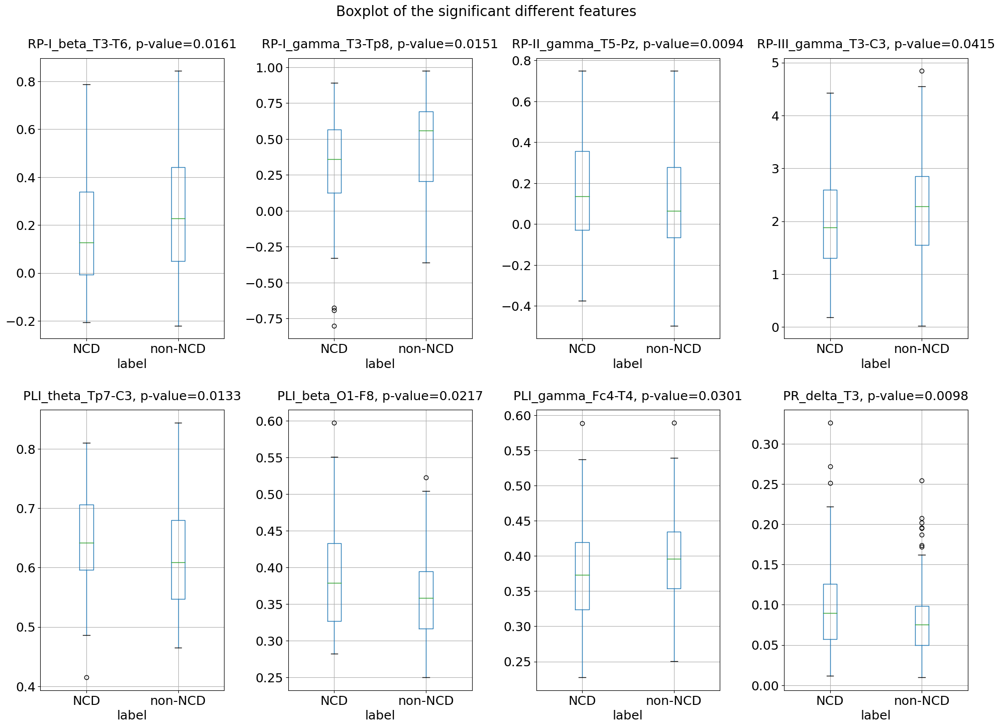

In [154]:
df = pd.DataFrame(data_train_valid[:, signi_diff_mask])
df.columns = data['train'].columns[signi_diff_mask]
label_train_valid_name = ['NCD' if label == 1 else 'non-NCD' for label in label_train_valid]
df['label'] = label_train_valid_name


import matplotlib.pyplot as plt

fig, axes = plt.subplots(2,4)

fig.set_figheight(15)
fig.set_figwidth(20)

for i,el in enumerate(list(df.columns.values)[:-1]):
    a = df.boxplot(el, by="label", ax=axes.flatten()[i], fontsize=18, figsize=(4, 5))
    tmp_p_value = signi_diff_features.loc[signi_diff_features.feature_name == el].p_value.values[0]
    if el.split('_')[0] == 'RatioPower':
        el = f'PR_{el.split("_")[1]}_{el.split("_")[2]}'
    a.set_title(f'{el}, p-value={tmp_p_value:1.4f}', fontsize=18, y=1.02)
    a.set_xlabel('label', fontsize=18)


plt.tight_layout(pad=3.0) 
fig.suptitle('Boxplot of the significant different features', fontsize=20)
plt.show()

### correlation with scales

import scales

In [185]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.pipeline import Pipeline
from sklearn.model_selection import LeaveOneOut
from tqdm import tqdm, trange
import os
from feature_related import feature_selection as f_selection  # Import the feature_selection module
from joblib import dump, load
from sklearn.model_selection import GridSearchCV
import pandas as pd

# organizing - scores of different mental scales
scales_df = {}
scales_names = ['GDS_total', 'MMSE_total', 'IADL_total', 'ADL_total', 'CDR_total', 'MoCA_total']
for key, value in info.items():
    if key != 'Info':
        scales_df[key] = value[scales_names]
    else:
        scales_df[key] = value

scales_train_valid = pd.concat([scales_df['train'], scales_df['valid']], axis=0)
scales_test = scales_df['test']

scales_train_valid.reset_index(drop=True, inplace=True)
df = pd.concat([df, scales_train_valid], axis=1)

In [189]:
aa = df.drop('label', axis=1)

corr_matrix = aa.corr()

corr_matrix_a = corr_matrix.loc['RP-I_beta_T3-T6':'RatioPower_delta_T3', 'GDS_total':'MoCA_total']

RP-I_beta_T3-T6
RP-I_gamma_T3-Tp8
RP-II_gamma_T5-Pz
RP-III_gamma_T3-C3
PLI_theta_Tp7-C3
PLI_beta_O1-F8
PLI_gamma_Fc4-T4
PR_delta_T3


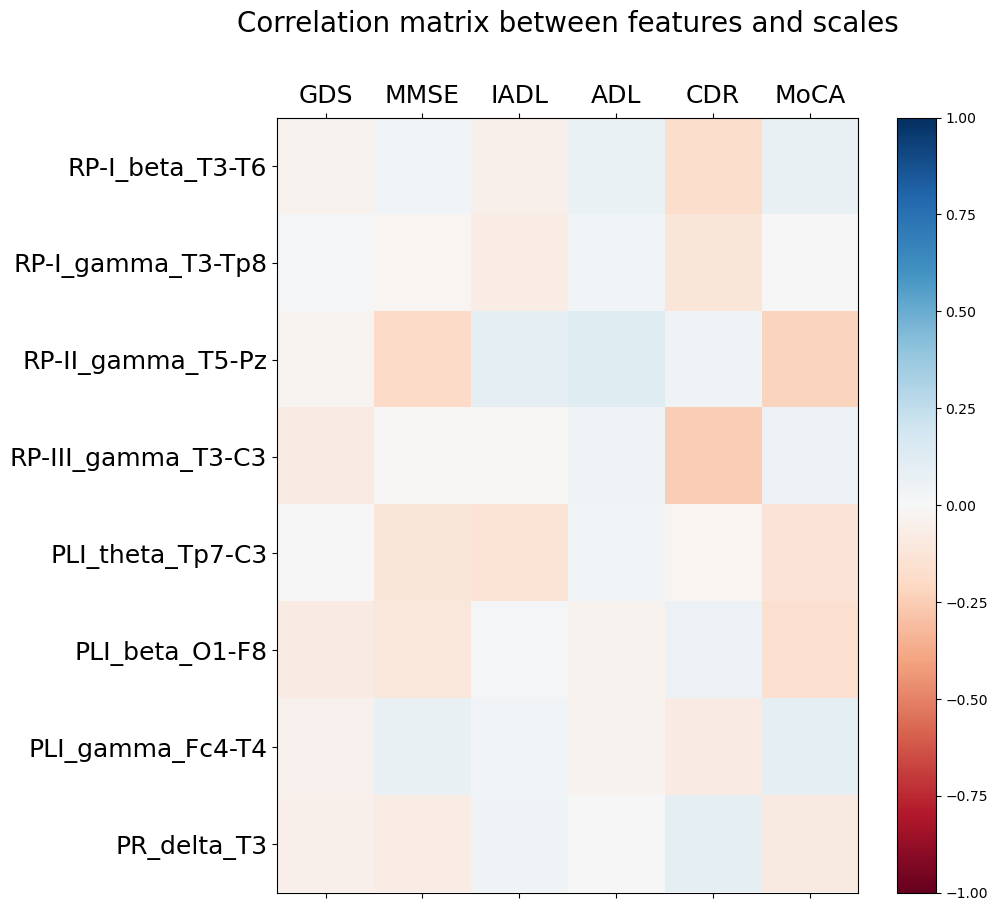

In [216]:
import matplotlib.pyplot as plt

feature_name_elec = corr_matrix_a.index.values
for i, el in enumerate(feature_name_elec):
    print(el)
    if el.split('_')[0] == 'RatioPower':
        feature_name_elec[i] = f'PR_{el.split("_")[1]}_{el.split("_")[2]}'

scale_name = corr_matrix_a.columns.values
for i, el in enumerate(scale_name): scale_name[i] = el.split('_')[0]

plt.figure(figsize=(10,10))
plt.matshow(corr_matrix_a, fignum=1, cmap='RdBu', vmin=-1, vmax=1)
plt.xticks(range(corr_matrix_a.shape[1]), scale_name, fontsize=18, rotation=0)
plt.yticks(range(corr_matrix_a.shape[0]), feature_name_elec, fontsize=18)
plt.colorbar()
plt.title('Correlation matrix between features and scales', y=1.1, fontsize=20)
plt.show()

In [234]:
from scipy import stats

result = []

# 迭帶每一個feature type: COH -> PLI...
corr_matrix = []
min_coef = 0.3
mask_high_corr = []
for unique_type in unique_types_feat:
    print(unique_type)
    mask = [unique_type == col.split('_')[0] for col in plot_feature_names]
    tmp = data_train_valid[:, plot_idx[mask]]

    # statistics of the selected features
    for col in range(tmp.shape[1]):
        feature_name_elec = plot_feature_names[mask][col] # Get the feature name
        
        tmp_coef = []
        for i, scl in enumerate(scales_train_valid.columns):
            coef, pvalue = stats.pearsonr(tmp[:,col], scales_train_valid[scl])
            
            tmp_coef.append(coef)
        corr_matrix.append(tmp_coef)

        mask_high_corr.append([abs(coef) > min_coef for coef in tmp_coef])

Coh
Corr
KFD
LogBP
PLI
PLV
RP-I
RP-II
RP-III
RatioPower


In [235]:
# find True in the mask_high_corr
mask_high_corr = np.array(mask_high_corr)
mask_high_corr = np.sum(mask_high_corr, axis=1) > 0
mask_high_corr

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False])

## dimension reduction

C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\3521562260.py:19: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\3521562260.py:30: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')


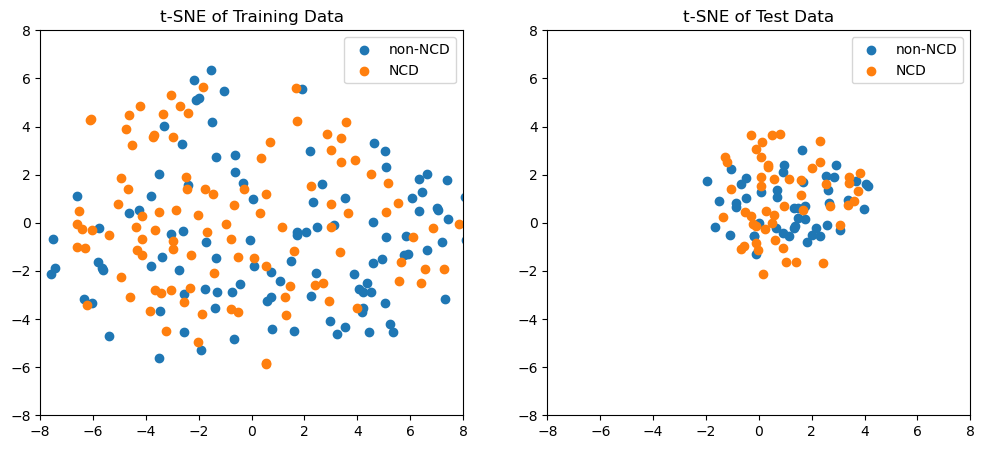

C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\3521562260.py:48: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\3521562260.py:60: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')


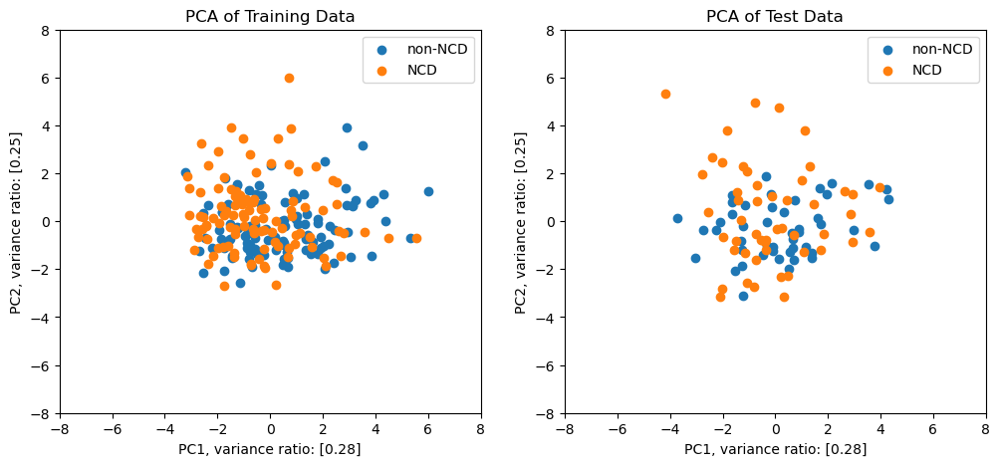

In [56]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Assuming data_train_valid, data_test, label_train_valid, label_test, df_accCV, and plot_idx are defined

# TSNE
tsne = TSNE(perplexity=50, early_exaggeration=1)
X_embedded_train_valid = tsne.fit_transform(data_train_valid[:, plot_idx])
X_embedded_test = tsne.fit_transform(data_test[:, plot_idx])

label_names = ['non-NCD', 'NCD']
# Plot TSNE
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
unique_labels = set(label_train_valid)
for label in unique_labels:
    indices = [i for i, l in enumerate(label_train_valid) if l == label]
    plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
    # limit
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.title(f't-SNE of Training Data')
plt.legend()

plt.subplot(1, 2, 2)
unique_labels_test = set(label_test)
for label in unique_labels_test:
    indices = [i for i, l in enumerate(label_test) if l == label]
    plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')
# limit
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.title(f't-SNE of Test Data')
plt.legend(loc='upper right')
plt.show()

# PCA
pca = PCA(n_components=2)
X_embedded_train_valid = pca.fit_transform(data_train_valid[:, plot_idx])
X_embedded_test = pca.fit_transform(data_test[:, plot_idx])

# Plot PCA
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
for label in unique_labels:
    indices = [i for i, l in enumerate(label_train_valid) if l == label]
    plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
# limit
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.title(f'PCA of Training Data')
plt.legend()
plt.xlabel(f'PC1, variance ratio: [{round(pca.explained_variance_ratio_[0], 2)}]')
plt.ylabel(f'PC2, variance ratio: [{round(pca.explained_variance_ratio_[1], 2)}]')

plt.subplot(1, 2, 2)
for label in unique_labels_test:
    indices = [i for i, l in enumerate(label_test) if l == label]
    plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')
# limit
plt.xlim(-8, 8)
plt.ylim(-8, 8)
plt.title(f'PCA of Test Data')
plt.legend()
plt.xlabel(f'PC1, variance ratio: [{round(pca.explained_variance_ratio_[0], 2)}]')
plt.ylabel(f'PC2, variance ratio: [{round(pca.explained_variance_ratio_[1], 2)}]')
plt.show()

plot of normalized data

C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\855336624.py:28: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\855336624.py:39: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')


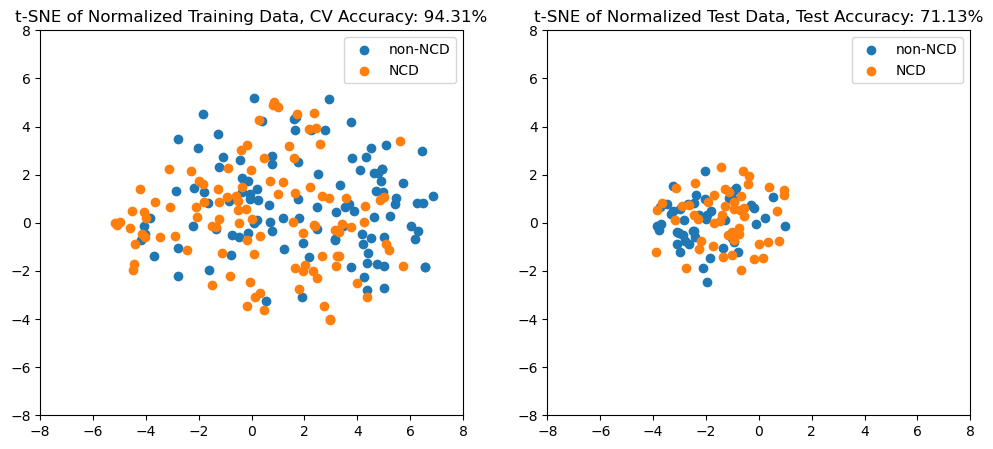

C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\855336624.py:57: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
C:\Users\NESS\AppData\Local\Temp\ipykernel_45988\855336624.py:69: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')


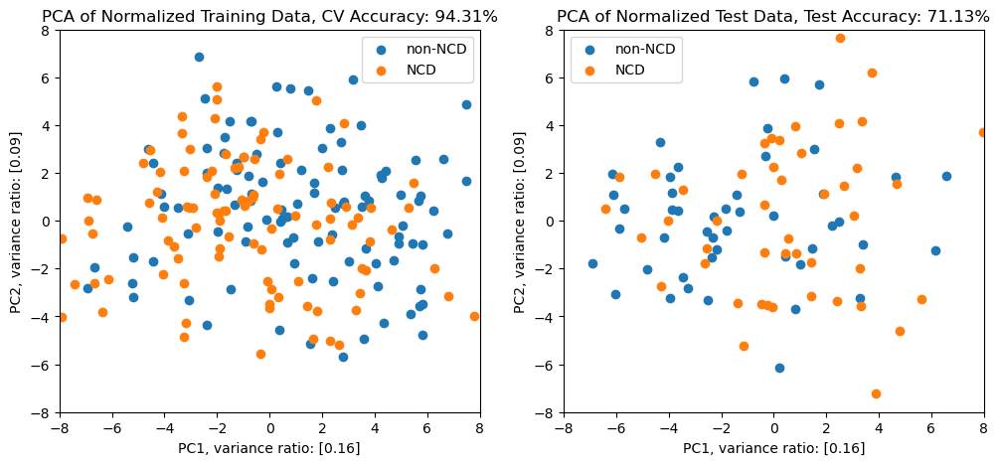

In [53]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Assuming data_train_valid, data_test, label_train_valid, label_test, df_accCV, and plot_idx are defined

# scale the data
scaler = StandardScaler()
data_train_valid_scaled = scaler.fit_transform(data_train_valid[:, plot_idx])
data_test_scaled = scaler.transform(data_test[:, plot_idx])

# TSNE
tsne = TSNE(perplexity=50, early_exaggeration=1)
X_embedded_train_valid = tsne.fit_transform(data_train_valid_scaled)
X_embedded_test = tsne.fit_transform(data_test_scaled)



label_names = ['non-NCD', 'NCD']
# Plot TSNE
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
unique_labels = set(label_train_valid)
for label in unique_labels:
    indices = [i for i, l in enumerate(label_train_valid) if l == label]
    plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
    # limit
    plt.xlim(-8, 8)
    plt.ylim(-8, 8)
plt.title(f't-SNE of Normalized Training Data, CV Accuracy: {round(df_accCV.avg_score.iloc[max_test_idx], 4):.2%}')
plt.legend()

plt.subplot(1, 2, 2)
unique_labels_test = set(label_test)
for label in unique_labels_test:
    indices = [i for i, l in enumerate(label_test) if l == label]
    plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')
    # limit
    plt.xlim(-8, 8)
    plt.ylim(-8, 8)
plt.title(f't-SNE of Normalized Test Data, Test Accuracy: {round(df_accCV.test_score.iloc[max_test_idx], 4):.2%}')
plt.legend(loc='upper right')
plt.show()

# PCA
pca = PCA(n_components=2)
X_embedded_train_valid = pca.fit_transform(data_train_valid_scaled)
X_embedded_test = pca.fit_transform(data_test_scaled)

# Plot PCA
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
for label in unique_labels:
    indices = [i for i, l in enumerate(label_train_valid) if l == label]
    plt.scatter(X_embedded_train_valid[indices, 0], X_embedded_train_valid[indices, 1], label=label_names[label], cmap='viridis')
    # limit
    plt.xlim(-8, 8)
    plt.ylim(-8, 8)
plt.title(f'PCA of Normalized Training Data, CV Accuracy: {round(df_accCV.avg_score.iloc[max_test_idx], 4):.2%}')
plt.legend()
plt.xlabel(f'PC1, variance ratio: [{round(pca.explained_variance_ratio_[0], 2)}]')
plt.ylabel(f'PC2, variance ratio: [{round(pca.explained_variance_ratio_[1], 2)}]')

plt.subplot(1, 2, 2)
for label in unique_labels_test:
    indices = [i for i, l in enumerate(label_test) if l == label]
    plt.scatter(X_embedded_test[indices, 0], X_embedded_test[indices, 1], label=label_names[label], cmap='viridis')
    # limit
    plt.xlim(-8, 8)
    plt.ylim(-8, 8)
plt.title(f'PCA of Normalized Test Data, Test Accuracy: {round(df_accCV.test_score.iloc[max_test_idx], 4):.2%}')
plt.legend()
plt.xlabel(f'PC1, variance ratio: [{round(pca.explained_variance_ratio_[0], 2)}]')
plt.ylabel(f'PC2, variance ratio: [{round(pca.explained_variance_ratio_[1], 2)}]')
plt.show()